# LEAD SCORE CASE STUDY

## Step 1: Importing Data

In [3]:
# Suppressing Warnings
import warnings
warnings.filterwarnings('ignore')

In [4]:
# Importing Pandas and NumPy
import pandas as pd, numpy as np

In [5]:
# importing liberaries
import matplotlib.pyplot as plt
import seaborn as sns

In [6]:
# Importing all datasets
df =  pd.read_csv("Leads.csv")
df.head()

,Prospect ID,Lead Number,Lead Origin,Lead Source,Do Not Email,Do Not Call,Converted,TotalVisits,Total Time Spent on Website,Page Views Per Visit,...,Get updates on DM Content,Lead Profile,City,Asymmetrique Activity Index,Asymmetrique Profile Index,Asymmetrique Activity Score,Asymmetrique Profile Score,I agree to pay the amount through cheque,A free copy of Mastering The Interview,Last Notable Activity
0,7927b2df-8bba-4d29-b9a2-b6e0beafe620,660737,API,Olark Chat,No,No,0,0.0,0,0.0,...,No,Select,Select,02.Medium,02.Medium,15.0,15.0,No,No,Modified
1,2a272436-5132-4136-86fa-dcc88c88f482,660728,API,Organic Search,No,No,0,5.0,674,2.5,...,No,Select,Select,02.Medium,02.Medium,15.0,15.0,No,No,Email Opened
2,8cc8c611-a219-4f35-ad23-fdfd2656bd8a,660727,Landing Page Submission,Direct Traffic,No,No,1,2.0,1532,2.0,...,No,Potential Lead,Mumbai,02.Medium,01.High,14.0,20.0,No,Yes,Email Opened
3,0cc2df48-7cf4-4e39-9de9-19797f9b38cc,660719,Landing Page Submission,Direct Traffic,No,No,0,1.0,305,1.0,...,No,Select,Mumbai,02.Medium,01.High,13.0,17.0,No,No,Modified
4,3256f628-e534-4826-9d63-4a8b88782852,660681,Landing Page Submission,Google,No,No,1,2.0,1428,1.0,...,No,Select,Mumbai,02.Medium,01.High,15.0,18.0,No,No,Modified


## Step 2: Inspecting the Dataframe

In [8]:
# checking the dimensions of the dataframe
df.shape

(9240, 37)

In [9]:
# looking at the statistical aspects of the dataframe
df.describe()

,Lead Number,Converted,TotalVisits,Total Time Spent on Website,Page Views Per Visit,Asymmetrique Activity Score,Asymmetrique Profile Score
count,9240.000000,9240.000000,9103.000000,9240.000000,9103.000000,5022.000000,5022.000000
mean,617188.435606,0.385390,3.445238,487.698268,2.362820,14.306252,16.344883
std,23405.995698,0.486714,4.854853,548.021466,2.161418,1.386694,1.811395
min,579533.000000,0.000000,0.000000,0.000000,0.000000,7.000000,11.000000
25%,596484.500000,0.000000,1.000000,12.000000,1.000000,14.000000,15.000000
50%,615479.000000,0.000000,3.000000,248.000000,2.000000,14.000000,16.000000
75%,637387.250000,1.000000,5.000000,936.000000,3.000000,15.000000,18.000000
max,660737.000000,1.000000,251.000000,2272.000000,55.000000,18.000000,20.000000


In [10]:
# checking the type of each column
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9240 entries, 0 to 9239
Data columns (total 37 columns):
 #   Column                                         Non-Null Count  Dtype  
---  ------                                         --------------  -----  
 0   Prospect ID                                    9240 non-null   object 
 1   Lead Number                                    9240 non-null   int64  
 2   Lead Origin                                    9240 non-null   object 
 3   Lead Source                                    9204 non-null   object 
 4   Do Not Email                                   9240 non-null   object 
 5   Do Not Call                                    9240 non-null   object 
 6   Converted                                      9240 non-null   int64  
 7   TotalVisits                                    9103 non-null   float64
 8   Total Time Spent on Website                    9240 non-null   int64  
 9   Page Views Per Visit                           9103 

## Step 3: Data Processing (Missing Value Imputation and Outliers)

In [12]:
# checking percentage of null values in all the columns so that it can taken care of.
100*df.isnull().mean()

Prospect ID                                       0.000000
Lead Number                                       0.000000
Lead Origin                                       0.000000
Lead Source                                       0.389610
Do Not Email                                      0.000000
Do Not Call                                       0.000000
Converted                                         0.000000
TotalVisits                                       1.482684
Total Time Spent on Website                       0.000000
Page Views Per Visit                              1.482684
Last Activity                                     1.114719
Country                                          26.634199
Specialization                                   15.562771
How did you hear about X Education               23.885281
What is your current occupation                  29.112554
What matters most to you in choosing a course    29.318182
Search                                            0.0000

In [13]:
# calculating all the columns which has more than 30% of null values
cols_to_drop = list(df.columns[100* df.isnull().mean() >30])
print(cols_to_drop)

['Tags', 'Lead Quality', 'Asymmetrique Activity Index', 'Asymmetrique Profile Index', 'Asymmetrique Activity Score', 'Asymmetrique Profile Score']


In [14]:
df["Lead Profile"].value_counts()

Lead Profile
Select                         4146
Potential Lead                 1613
Other Leads                     487
Student of SomeSchool           241
Lateral Student                  24
Dual Specialization Student      20
Name: count, dtype: int64

In [15]:
df["How did you hear about X Education"].value_counts()

How did you hear about X Education
Select                   5043
Online Search             808
Word Of Mouth             348
Student of SomeSchool     310
Other                     186
Multiple Sources          152
Advertisements             70
Social Media               67
Email                      26
SMS                        23
Name: count, dtype: int64

In [16]:
# as we can see Lead Profile and How did you hear about X Education have a lot of rows which have the value Select which is of no use to the analysis so it's best that we drop them.
df.drop(['Lead Profile', 'How did you hear about X Education'], axis = 1, inplace = True)

In [17]:
# dropping all the columns which has more than 30% of null values so that itwont affect the analysis
df = df.drop(cols_to_drop,axis = 1)

In [18]:
# checking again the shape of dataset to know that those columns have been droppped or not
df.shape

(9240, 29)

In [19]:
# now calculating all the columns which has null values
100*df.isnull().mean()

Prospect ID                                       0.000000
Lead Number                                       0.000000
Lead Origin                                       0.000000
Lead Source                                       0.389610
Do Not Email                                      0.000000
Do Not Call                                       0.000000
Converted                                         0.000000
TotalVisits                                       1.482684
Total Time Spent on Website                       0.000000
Page Views Per Visit                              1.482684
Last Activity                                     1.114719
Country                                          26.634199
Specialization                                   15.562771
What is your current occupation                  29.112554
What matters most to you in choosing a course    29.318182
Search                                            0.000000
Magazine                                          0.0000

In [20]:
pd.set_option('display.max_rows', None) 
pd.set_option('display.max_columns', None)

In [21]:
# seperating numerical and categorical columns and coverting them into a list so we can understand which are numerical columns and which are categorical ones. taking unique values as 30 because most of the time if in a column there are more than 30 unique values then its numerical column
cat_cols = []
num_cols = []
for i in df.columns:
    if df[i].nunique()>30:
        num_cols.append(i)
    else:
        cat_cols.append(i)

In [22]:
cat_cols

['Lead Origin',
 'Lead Source',
 'Do Not Email',
 'Do Not Call',
 'Converted',
 'Last Activity',
 'Specialization',
 'What is your current occupation',
 'What matters most to you in choosing a course',
 'Search',
 'Magazine',
 'Newspaper Article',
 'X Education Forums',
 'Newspaper',
 'Digital Advertisement',
 'Through Recommendations',
 'Receive More Updates About Our Courses',
 'Update me on Supply Chain Content',
 'Get updates on DM Content',
 'City',
 'I agree to pay the amount through cheque',
 'A free copy of Mastering The Interview',
 'Last Notable Activity']

In [23]:
# Dictionary to store unique values for each column
unique_values = {}

# Iterate through the specified columns
for col in cat_cols:
    unique_values[col] = df[col].unique()
    
# Print the unique values for each column
for col, values in unique_values.items():
    print(f'Unique values in column {col}: {values}')

Unique values in column Lead Origin: ['API' 'Landing Page Submission' 'Lead Add Form' 'Lead Import'
 'Quick Add Form']
Unique values in column Lead Source: ['Olark Chat' 'Organic Search' 'Direct Traffic' 'Google' 'Referral Sites'
 'Welingak Website' 'Reference' 'google' 'Facebook' nan 'blog'
 'Pay per Click Ads' 'bing' 'Social Media' 'WeLearn' 'Click2call'
 'Live Chat' 'welearnblog_Home' 'youtubechannel' 'testone' 'Press_Release'
 'NC_EDM']
Unique values in column Do Not Email: ['No' 'Yes']
Unique values in column Do Not Call: ['No' 'Yes']
Unique values in column Converted: [0 1]
Unique values in column Last Activity: ['Page Visited on Website' 'Email Opened' 'Unreachable'
 'Converted to Lead' 'Olark Chat Conversation' 'Email Bounced'
 'Email Link Clicked' 'Form Submitted on Website' 'Unsubscribed'
 'Had a Phone Conversation' 'View in browser link Clicked' nan
 'Approached upfront' 'SMS Sent' 'Visited Booth in Tradeshow'
 'Resubscribed to emails' 'Email Received' 'Email Marked Spam']
U

In [24]:
df[cat_cols].nunique()<3

Lead Origin                                      False
Lead Source                                      False
Do Not Email                                      True
Do Not Call                                       True
Converted                                         True
Last Activity                                    False
Specialization                                   False
What is your current occupation                  False
What matters most to you in choosing a course    False
Search                                            True
Magazine                                          True
Newspaper Article                                 True
X Education Forums                                True
Newspaper                                         True
Digital Advertisement                             True
Through Recommendations                           True
Receive More Updates About Our Courses            True
Update me on Supply Chain Content                 True
Get update

In [25]:
unique_counts = df[cat_cols].nunique()

In [26]:
columns_with_few_unique_values = unique_counts[unique_counts < 3].index

In [27]:
columns_with_few_unique_values

Index(['Do Not Email', 'Do Not Call', 'Converted', 'Search', 'Magazine',
       'Newspaper Article', 'X Education Forums', 'Newspaper',
       'Digital Advertisement', 'Through Recommendations',
       'Receive More Updates About Our Courses',
       'Update me on Supply Chain Content', 'Get updates on DM Content',
       'I agree to pay the amount through cheque',
       'A free copy of Mastering The Interview'],
      dtype='object')

In [28]:
num_cols

['Prospect ID',
 'Lead Number',
 'TotalVisits',
 'Total Time Spent on Website',
 'Page Views Per Visit',
 'Country']

In [29]:
df[num_cols]

,Prospect ID,Lead Number,TotalVisits,Total Time Spent on Website,Page Views Per Visit,Country
0,7927b2df-8bba-4d29-b9a2-b6e0beafe620,660737,0.0,0,0.00,NaN
1,2a272436-5132-4136-86fa-dcc88c88f482,660728,5.0,674,2.50,India
2,8cc8c611-a219-4f35-ad23-fdfd2656bd8a,660727,2.0,1532,2.00,India
3,0cc2df48-7cf4-4e39-9de9-19797f9b38cc,660719,1.0,305,1.00,India
4,3256f628-e534-4826-9d63-4a8b88782852,660681,2.0,1428,1.00,India
5,2058ef08-2858-443e-a01f-a9237db2f5ce,660680,0.0,0,0.00,NaN
6,9fae7df4-169d-489b-afe4-0f3d752542ed,660673,2.0,1640,2.00,India
7,20ef72a2-fb3b-45e0-924e-551c5fa59095,660664,0.0,0,0.00,NaN
8,cfa0128c-a0da-4656-9d47-0aa4e67bf690,660624,2.0,71,2.00,India
9,af465dfc-7204-4130-9e05-33231863c4b5,660616,4.0,58,4.00,India


In [30]:
# Country column is categorical so added it into the cat_cols list
cat_cols.append('Country')

In [31]:
# Country column is not numerical so deleted it from the num_cols list
num_cols.remove('Country')

In [32]:
print(cat_cols)
print(num_cols)

['Lead Origin', 'Lead Source', 'Do Not Email', 'Do Not Call', 'Converted', 'Last Activity', 'Specialization', 'What is your current occupation', 'What matters most to you in choosing a course', 'Search', 'Magazine', 'Newspaper Article', 'X Education Forums', 'Newspaper', 'Digital Advertisement', 'Through Recommendations', 'Receive More Updates About Our Courses', 'Update me on Supply Chain Content', 'Get updates on DM Content', 'City', 'I agree to pay the amount through cheque', 'A free copy of Mastering The Interview', 'Last Notable Activity', 'Country']
['Prospect ID', 'Lead Number', 'TotalVisits', 'Total Time Spent on Website', 'Page Views Per Visit']


In [33]:
df[num_cols].head()

,Prospect ID,Lead Number,TotalVisits,Total Time Spent on Website,Page Views Per Visit
0,7927b2df-8bba-4d29-b9a2-b6e0beafe620,660737,0.0,0,0.0
1,2a272436-5132-4136-86fa-dcc88c88f482,660728,5.0,674,2.5
2,8cc8c611-a219-4f35-ad23-fdfd2656bd8a,660727,2.0,1532,2.0
3,0cc2df48-7cf4-4e39-9de9-19797f9b38cc,660719,1.0,305,1.0
4,3256f628-e534-4826-9d63-4a8b88782852,660681,2.0,1428,1.0


In [34]:
# checking the dtype of all the numerical columns
df[num_cols].info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9240 entries, 0 to 9239
Data columns (total 5 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   Prospect ID                  9240 non-null   object 
 1   Lead Number                  9240 non-null   int64  
 2   TotalVisits                  9103 non-null   float64
 3   Total Time Spent on Website  9240 non-null   int64  
 4   Page Views Per Visit         9103 non-null   float64
dtypes: float64(2), int64(2), object(1)
memory usage: 361.1+ KB


In [35]:
# now calculating all the columns which has null values
100*df.isnull().mean()

Prospect ID                                       0.000000
Lead Number                                       0.000000
Lead Origin                                       0.000000
Lead Source                                       0.389610
Do Not Email                                      0.000000
Do Not Call                                       0.000000
Converted                                         0.000000
TotalVisits                                       1.482684
Total Time Spent on Website                       0.000000
Page Views Per Visit                              1.482684
Last Activity                                     1.114719
Country                                          26.634199
Specialization                                   15.562771
What is your current occupation                  29.112554
What matters most to you in choosing a course    29.318182
Search                                            0.000000
Magazine                                          0.0000

In [36]:
# after removing columns which had more than 40% of null values now we will take each column for imputing null values

### Handling missing values of num_cols

In [38]:
num_cols

['Prospect ID',
 'Lead Number',
 'TotalVisits',
 'Total Time Spent on Website',
 'Page Views Per Visit']

In [39]:
num_cols_with_missing_values = ["TotalVisits","Page Views Per Visit"]

In [40]:
# imputing all the null values of numerical column with median because some of the columns have outliers so for better analysis I took median because it will not be affected by outliers

for i in num_cols_with_missing_values:
    if df[i].isnull().mean() > 0:
        med = df[i].median()
        df[i] = df[i].fillna(med)

In [41]:
# now calculating all the columns which has null values
100*df.isnull().mean()

Prospect ID                                       0.000000
Lead Number                                       0.000000
Lead Origin                                       0.000000
Lead Source                                       0.389610
Do Not Email                                      0.000000
Do Not Call                                       0.000000
Converted                                         0.000000
TotalVisits                                       0.000000
Total Time Spent on Website                       0.000000
Page Views Per Visit                              0.000000
Last Activity                                     1.114719
Country                                          26.634199
Specialization                                   15.562771
What is your current occupation                  29.112554
What matters most to you in choosing a course    29.318182
Search                                            0.000000
Magazine                                          0.0000

In [42]:
# Dictionary to store unique values for each column
unique_values = {}

# Iterate through the specified columns
for col in cat_cols:
    unique_values[col] = df[col].unique()
    
# Print the unique values for each column
for col, values in unique_values.items():
    print(f'Unique values in column {col}: {values}')

Unique values in column Lead Origin: ['API' 'Landing Page Submission' 'Lead Add Form' 'Lead Import'
 'Quick Add Form']
Unique values in column Lead Source: ['Olark Chat' 'Organic Search' 'Direct Traffic' 'Google' 'Referral Sites'
 'Welingak Website' 'Reference' 'google' 'Facebook' nan 'blog'
 'Pay per Click Ads' 'bing' 'Social Media' 'WeLearn' 'Click2call'
 'Live Chat' 'welearnblog_Home' 'youtubechannel' 'testone' 'Press_Release'
 'NC_EDM']
Unique values in column Do Not Email: ['No' 'Yes']
Unique values in column Do Not Call: ['No' 'Yes']
Unique values in column Converted: [0 1]
Unique values in column Last Activity: ['Page Visited on Website' 'Email Opened' 'Unreachable'
 'Converted to Lead' 'Olark Chat Conversation' 'Email Bounced'
 'Email Link Clicked' 'Form Submitted on Website' 'Unsubscribed'
 'Had a Phone Conversation' 'View in browser link Clicked' nan
 'Approached upfront' 'SMS Sent' 'Visited Booth in Tradeshow'
 'Resubscribed to emails' 'Email Received' 'Email Marked Spam']
U

In [43]:
df.head()

,Prospect ID,Lead Number,Lead Origin,Lead Source,Do Not Email,Do Not Call,Converted,TotalVisits,Total Time Spent on Website,Page Views Per Visit,Last Activity,Country,Specialization,What is your current occupation,What matters most to you in choosing a course,Search,Magazine,Newspaper Article,X Education Forums,Newspaper,Digital Advertisement,Through Recommendations,Receive More Updates About Our Courses,Update me on Supply Chain Content,Get updates on DM Content,City,I agree to pay the amount through cheque,A free copy of Mastering The Interview,Last Notable Activity
0,7927b2df-8bba-4d29-b9a2-b6e0beafe620,660737,API,Olark Chat,No,No,0,0.0,0,0.0,Page Visited on Website,NaN,Select,Unemployed,Better Career Prospects,No,No,No,No,No,No,No,No,No,No,Select,No,No,Modified
1,2a272436-5132-4136-86fa-dcc88c88f482,660728,API,Organic Search,No,No,0,5.0,674,2.5,Email Opened,India,Select,Unemployed,Better Career Prospects,No,No,No,No,No,No,No,No,No,No,Select,No,No,Email Opened
2,8cc8c611-a219-4f35-ad23-fdfd2656bd8a,660727,Landing Page Submission,Direct Traffic,No,No,1,2.0,1532,2.0,Email Opened,India,Business Administration,Student,Better Career Prospects,No,No,No,No,No,No,No,No,No,No,Mumbai,No,Yes,Email Opened
3,0cc2df48-7cf4-4e39-9de9-19797f9b38cc,660719,Landing Page Submission,Direct Traffic,No,No,0,1.0,305,1.0,Unreachable,India,Media and Advertising,Unemployed,Better Career Prospects,No,No,No,No,No,No,No,No,No,No,Mumbai,No,No,Modified
4,3256f628-e534-4826-9d63-4a8b88782852,660681,Landing Page Submission,Google,No,No,1,2.0,1428,1.0,Converted to Lead,India,Select,Unemployed,Better Career Prospects,No,No,No,No,No,No,No,No,No,No,Mumbai,No,No,Modified


In [44]:
#if a column has other then Nan value will be replaces by other and if other is not there then it will be replaced by mode for categorical columns
for i in cat_cols:
    if df[i].isnull().mean() > 0:  # Check if there are any null values
        # Check if 'Other' is in the column's unique values
        if 'Other' in df[i].unique():
            df[i] = df[i].fillna('Other')
        else:
            # Impute with the mode if 'Other' is not present
            mod = df[i].mode()[0]
            df[i] = df[i].fillna(mod)


In [45]:
df.head()

,Prospect ID,Lead Number,Lead Origin,Lead Source,Do Not Email,Do Not Call,Converted,TotalVisits,Total Time Spent on Website,Page Views Per Visit,Last Activity,Country,Specialization,What is your current occupation,What matters most to you in choosing a course,Search,Magazine,Newspaper Article,X Education Forums,Newspaper,Digital Advertisement,Through Recommendations,Receive More Updates About Our Courses,Update me on Supply Chain Content,Get updates on DM Content,City,I agree to pay the amount through cheque,A free copy of Mastering The Interview,Last Notable Activity
0,7927b2df-8bba-4d29-b9a2-b6e0beafe620,660737,API,Olark Chat,No,No,0,0.0,0,0.0,Page Visited on Website,India,Select,Unemployed,Better Career Prospects,No,No,No,No,No,No,No,No,No,No,Select,No,No,Modified
1,2a272436-5132-4136-86fa-dcc88c88f482,660728,API,Organic Search,No,No,0,5.0,674,2.5,Email Opened,India,Select,Unemployed,Better Career Prospects,No,No,No,No,No,No,No,No,No,No,Select,No,No,Email Opened
2,8cc8c611-a219-4f35-ad23-fdfd2656bd8a,660727,Landing Page Submission,Direct Traffic,No,No,1,2.0,1532,2.0,Email Opened,India,Business Administration,Student,Better Career Prospects,No,No,No,No,No,No,No,No,No,No,Mumbai,No,Yes,Email Opened
3,0cc2df48-7cf4-4e39-9de9-19797f9b38cc,660719,Landing Page Submission,Direct Traffic,No,No,0,1.0,305,1.0,Unreachable,India,Media and Advertising,Unemployed,Better Career Prospects,No,No,No,No,No,No,No,No,No,No,Mumbai,No,No,Modified
4,3256f628-e534-4826-9d63-4a8b88782852,660681,Landing Page Submission,Google,No,No,1,2.0,1428,1.0,Converted to Lead,India,Select,Unemployed,Better Career Prospects,No,No,No,No,No,No,No,No,No,No,Mumbai,No,No,Modified


In [46]:
# now calculating all the columns which has null values
100*df.isnull().mean()

Prospect ID                                      0.0
Lead Number                                      0.0
Lead Origin                                      0.0
Lead Source                                      0.0
Do Not Email                                     0.0
Do Not Call                                      0.0
Converted                                        0.0
TotalVisits                                      0.0
Total Time Spent on Website                      0.0
Page Views Per Visit                             0.0
Last Activity                                    0.0
Country                                          0.0
Specialization                                   0.0
What is your current occupation                  0.0
What matters most to you in choosing a course    0.0
Search                                           0.0
Magazine                                         0.0
Newspaper Article                                0.0
X Education Forums                            

In [47]:
### Till now we have handled the missing values

### Handling Outliers

In [49]:
### Checking the outliers in the numerical data by box plots

Column Prospect ID is not numeric, skipping.


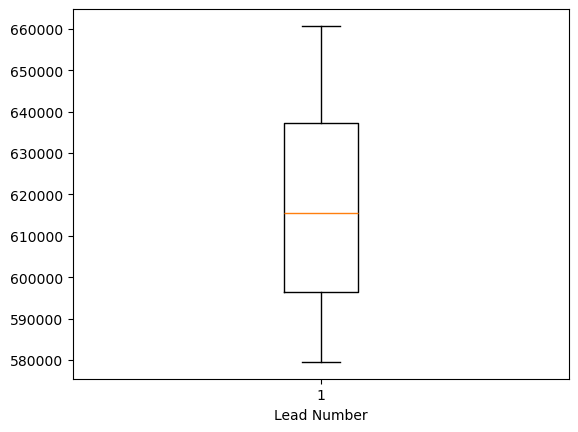

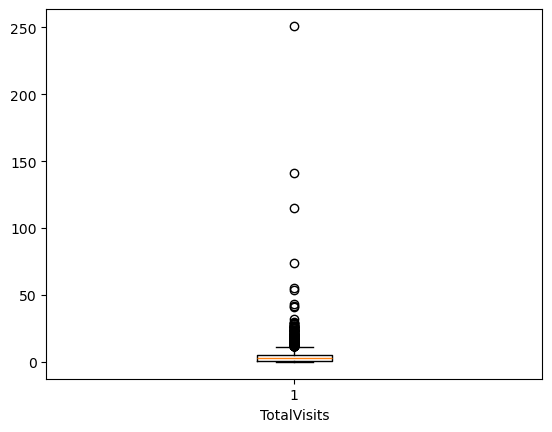

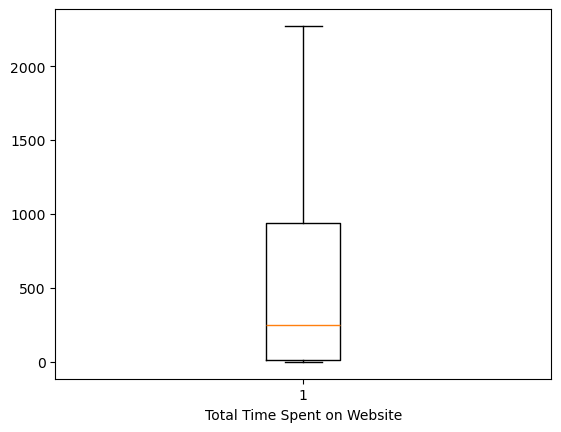

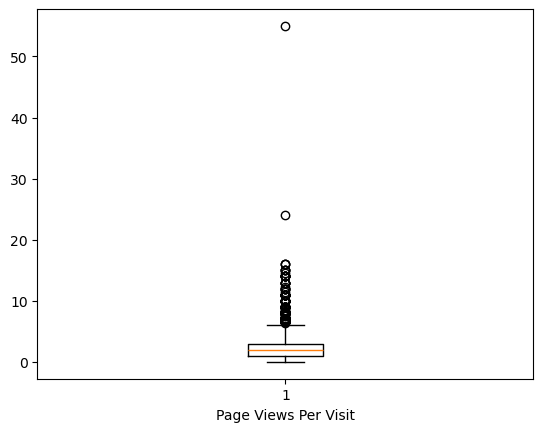

In [50]:

for i in num_cols:
    # Check if the column is numeric
    if pd.api.types.is_numeric_dtype(df[i]):
        plt.boxplot(df[i])  # No need to drop NaN since there are no missing values
        plt.xlabel(i)
        plt.show()
    else:
        print(f"Column {i} is not numeric, skipping.")


In [51]:
df[num_cols].dtypes

Prospect ID                     object
Lead Number                      int64
TotalVisits                    float64
Total Time Spent on Website      int64
Page Views Per Visit           float64
dtype: object

In [52]:
num_cols

['Prospect ID',
 'Lead Number',
 'TotalVisits',
 'Total Time Spent on Website',
 'Page Views Per Visit']

In [53]:
### as Prospect ID and Lead Number both are columns as serial numbers so creating a list of num_cols with out these 2
num_cols_1 = ['TotalVisits','Total Time Spent on Website','Page Views Per Visit']

In [54]:
# for Capping the outliers this will help us to analysis the data correctly. 
# capping upper outliers with upper_bound
# capping lower outliers with lower_bound
for i in num_cols_1:
    q1=df[i].describe()["25%"]# 25th Percentile
    q3=df[i].describe()["75%"]# 75th Percentile
    iqr=q3-q1
    upper_bound=q3+1.5*iqr
    lower_bound=q1-1.5*iqr
    df[i]=np.where(df[i]>upper_bound,upper_bound,df[i])
    df[i]=np.where(df[i]<lower_bound,lower_bound,df[i])

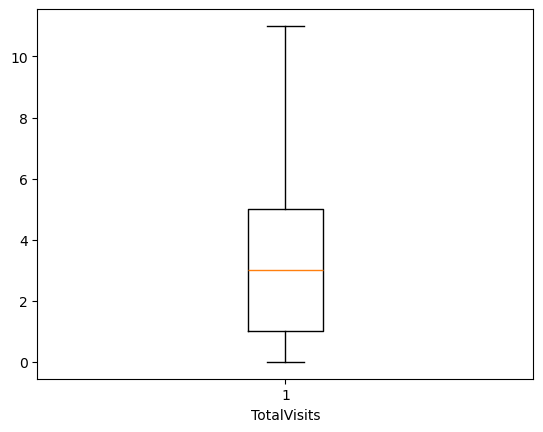

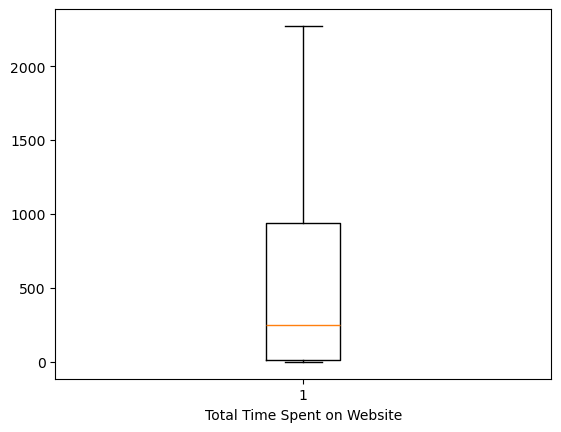

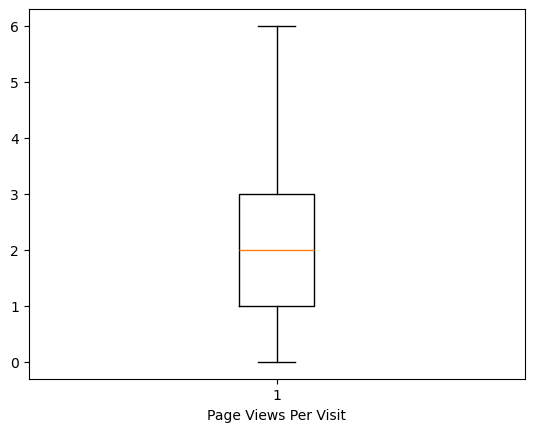

In [55]:
#As we can see through box plot that we dont have outliers in our data now.
for i in num_cols_1:
    plt.boxplot(df[i])
    plt.xlabel(i)
    plt.show()

## Step 4: EDA

### Univariate Analysis and Bivariate Analysis

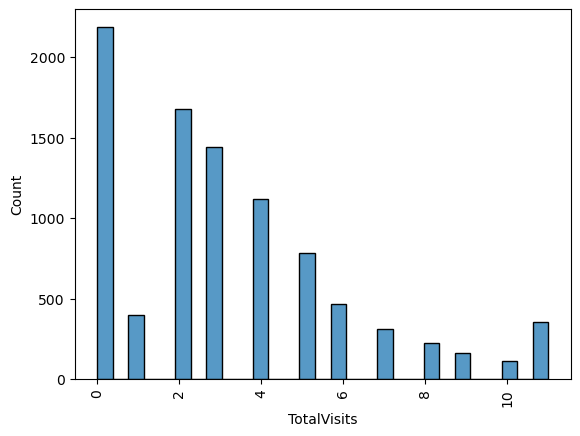

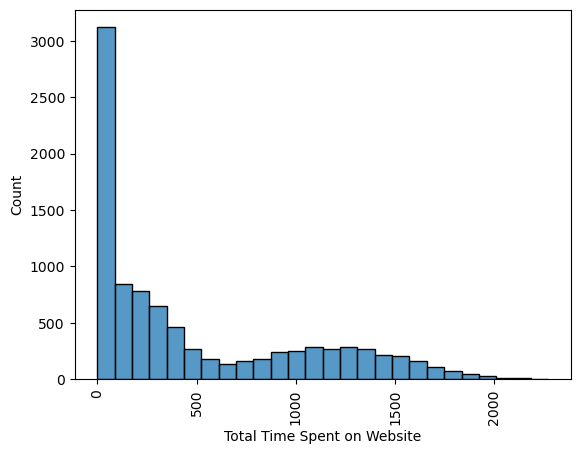

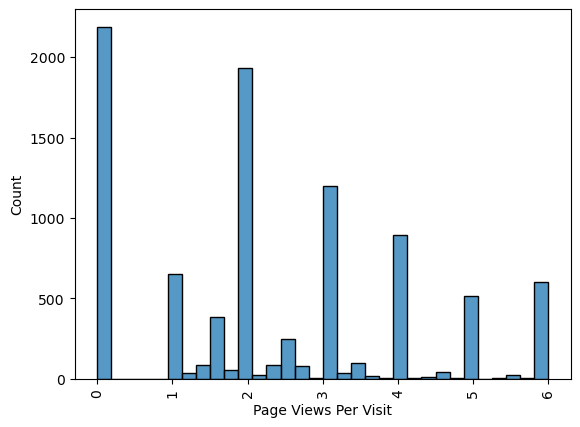

In [58]:
# breif analysis of all the numerical columns
for col in num_cols_1:
    sns.histplot(x=df[col])
    plt.xticks(rotation = 90)
    plt.show()

In [59]:
# Need to replace 'google' with 'Google' as both are same
df['Lead Source'] = df['Lead Source'].replace(['google'], 'Google')

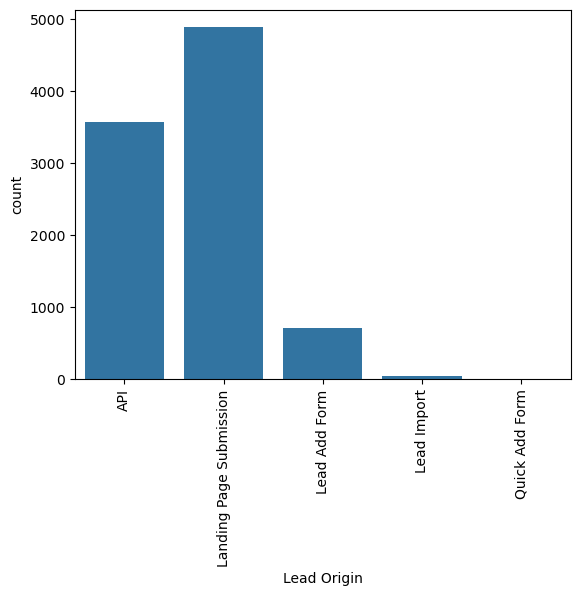

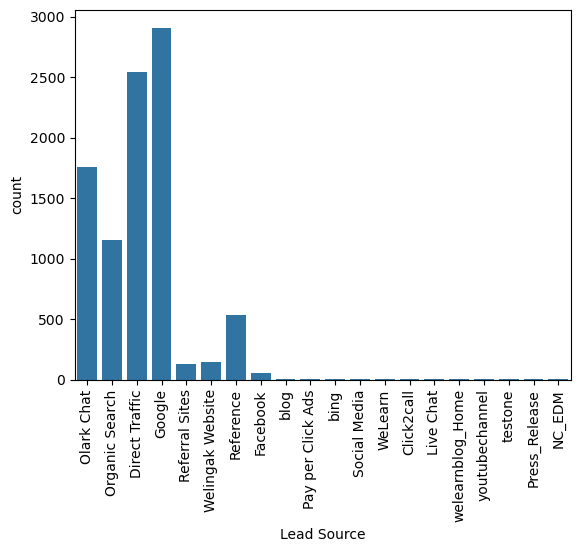

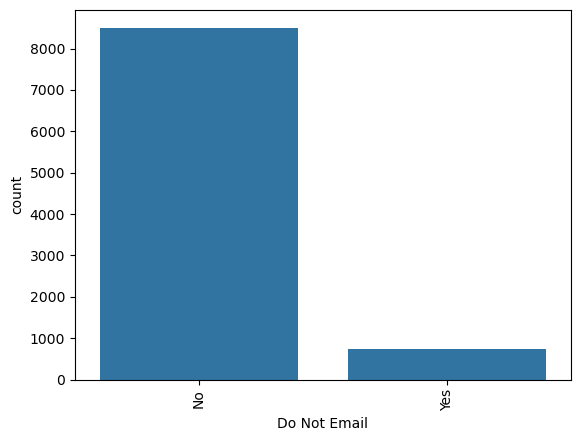

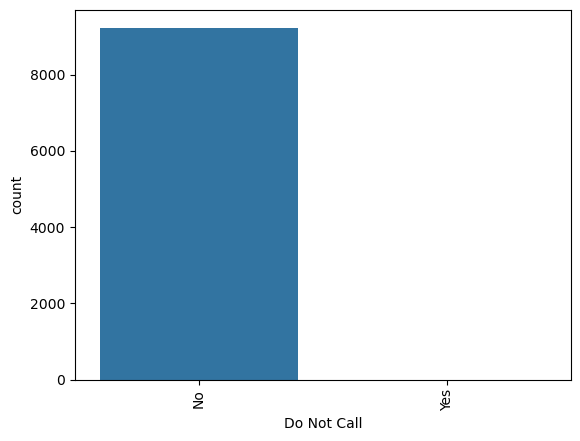

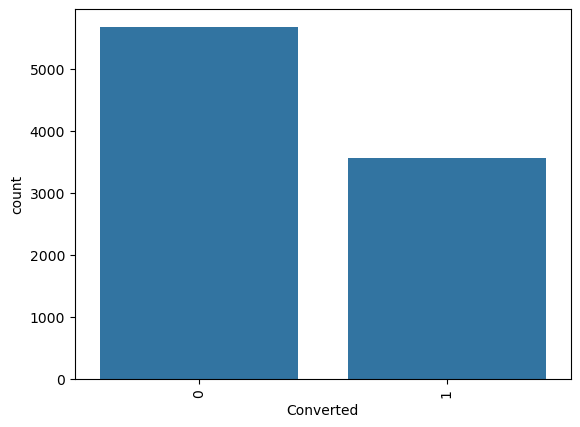

...

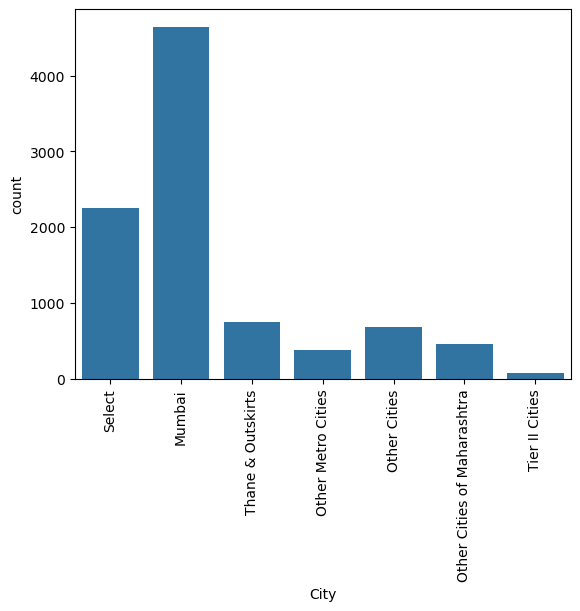

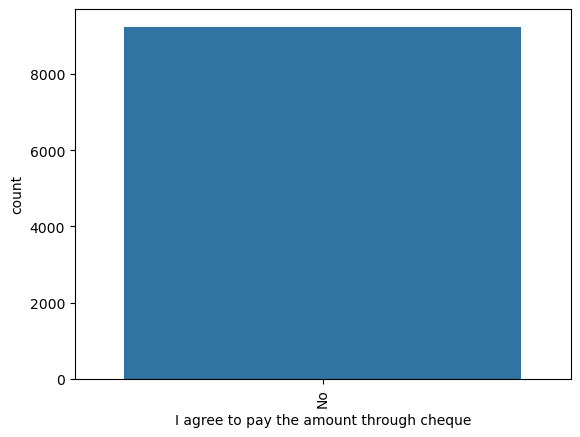

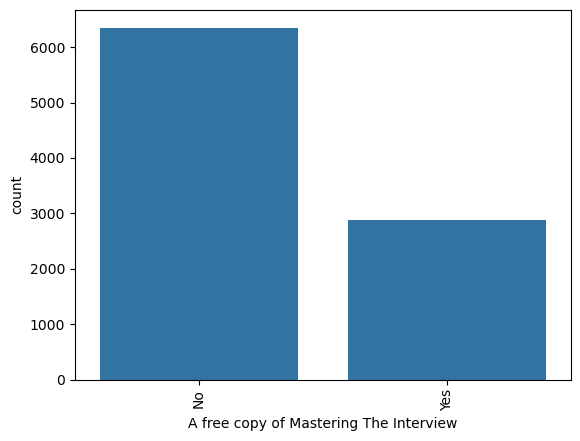

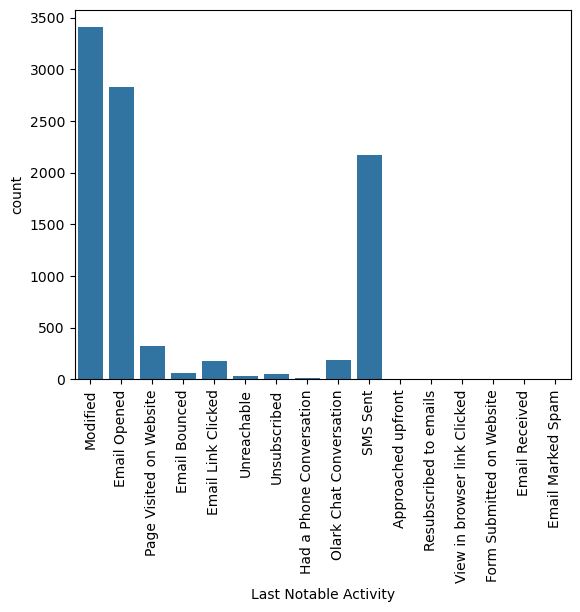

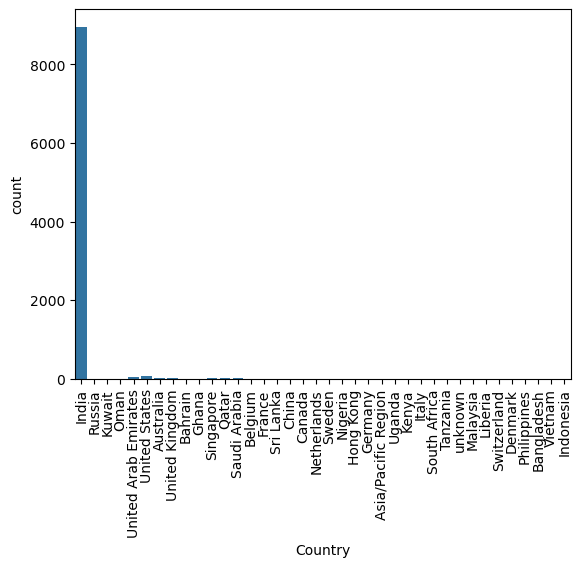

In [60]:
# breif analysis of all the categorical columns
for col in cat_cols:
    sns.countplot(x=df[col])
    plt.xticks(rotation = 90)
    plt.show()

<Axes: ylabel='count'>

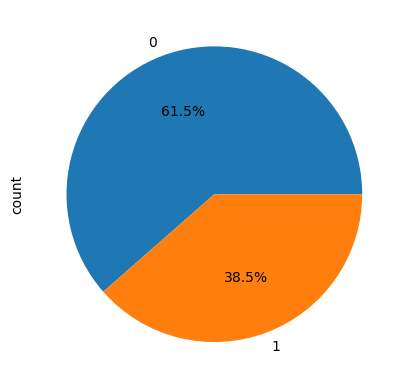

In [61]:
df.Converted.value_counts().plot.pie(autopct='%1.1f%%')
## lead converted are 38.5%

([0, 1, 2, 3, 4],
 [Text(0, 0, 'API'),
  Text(1, 0, 'Landing Page Submission'),
  Text(2, 0, 'Lead Add Form'),
  Text(3, 0, 'Lead Import'),
  Text(4, 0, 'Quick Add Form')])

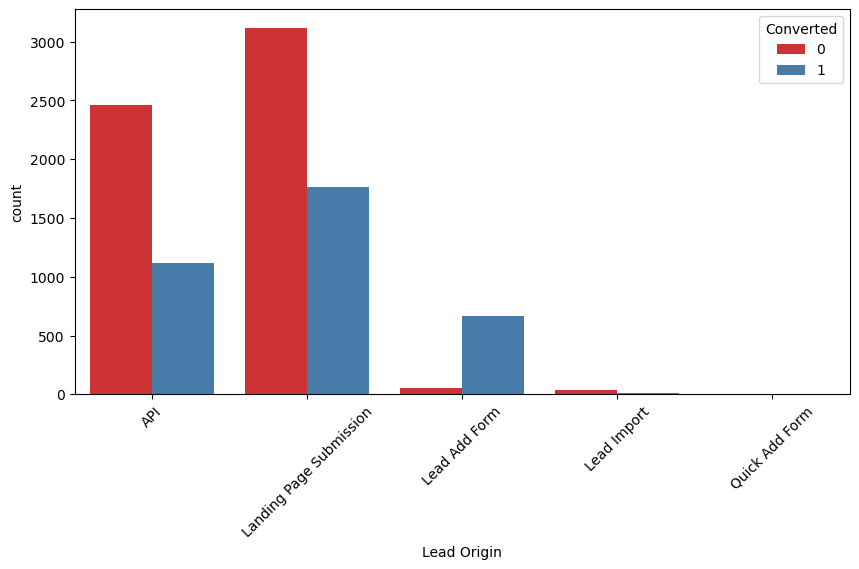

In [62]:
plt.figure(figsize=(10,5))
sns.countplot(x = "Lead Origin", hue = "Converted", data = df,palette='Set1')
plt.xticks(rotation = 45)
# landing page submission has high converted values

([0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19],
 [Text(0, 0, 'Olark Chat'),
  Text(1, 0, 'Organic Search'),
  Text(2, 0, 'Direct Traffic'),
  Text(3, 0, 'Google'),
  Text(4, 0, 'Referral Sites'),
  Text(5, 0, 'Welingak Website'),
  Text(6, 0, 'Reference'),
  Text(7, 0, 'Facebook'),
  Text(8, 0, 'blog'),
  Text(9, 0, 'Pay per Click Ads'),
  Text(10, 0, 'bing'),
  Text(11, 0, 'Social Media'),
  Text(12, 0, 'WeLearn'),
  Text(13, 0, 'Click2call'),
  Text(14, 0, 'Live Chat'),
  Text(15, 0, 'welearnblog_Home'),
  Text(16, 0, 'youtubechannel'),
  Text(17, 0, 'testone'),
  Text(18, 0, 'Press_Release'),
  Text(19, 0, 'NC_EDM')])

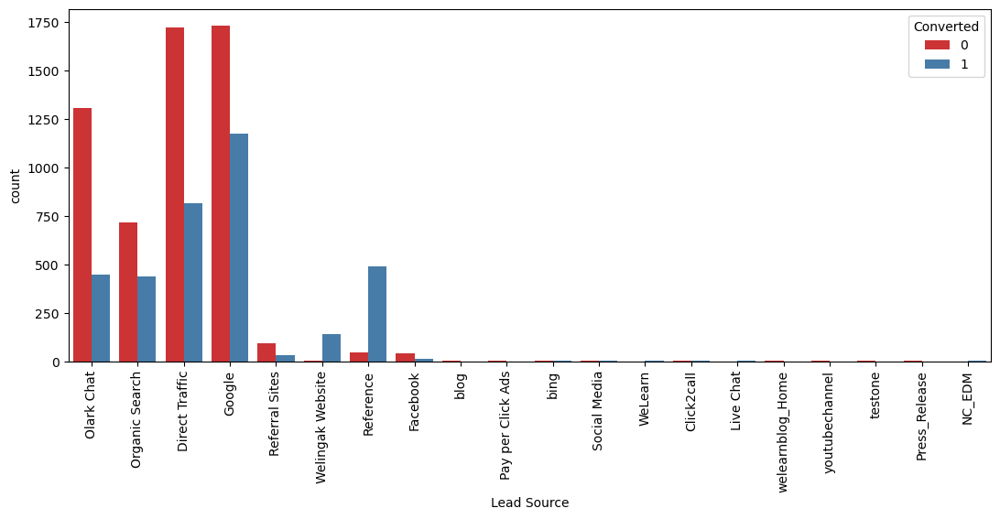

In [63]:
plt.figure(figsize=(13,5))
sns.countplot(x = "Lead Source", hue = "Converted", data = df, palette='Set1')
plt.xticks(rotation = 90)
# people who opened the website from google have been converted the most

In [64]:
# Creating a new category 'Others' for some of the Lead Sources which do not have much values.
df['Lead Source'] = df['Lead Source'].replace(['Click2call', 'Live Chat', 'NC_EDM', 'Pay per Click Ads', 'Press_Release',
  'Social Media', 'WeLearn', 'bing', 'blog', 'testone', 'welearnblog_Home', 'youtubechannel'], 'Others')

([0, 1, 2, 3, 4, 5, 6, 7, 8],
 [Text(0, 0, 'Olark Chat'),
  Text(1, 0, 'Organic Search'),
  Text(2, 0, 'Direct Traffic'),
  Text(3, 0, 'Google'),
  Text(4, 0, 'Referral Sites'),
  Text(5, 0, 'Welingak Website'),
  Text(6, 0, 'Reference'),
  Text(7, 0, 'Facebook'),
  Text(8, 0, 'Others')])

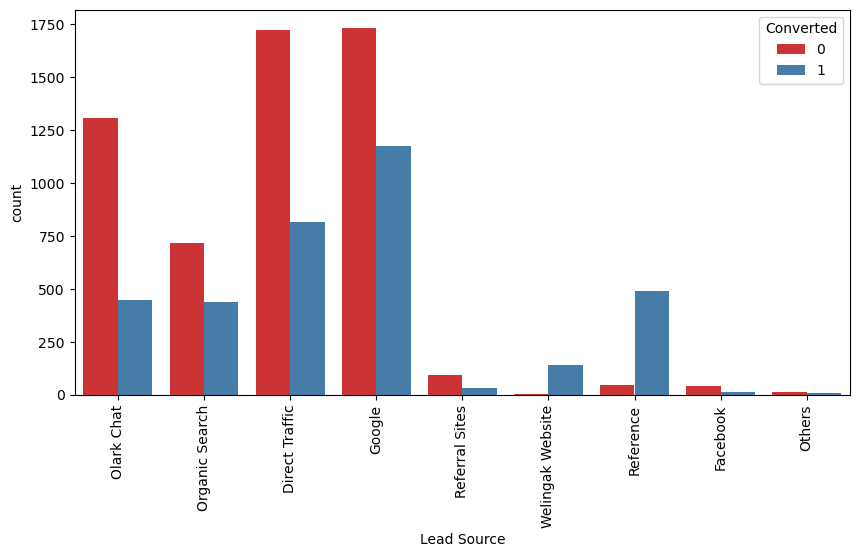

In [65]:
# Visualizing again
plt.figure(figsize=(10,5))
sns.countplot(x = "Lead Source", hue = "Converted", data = df,palette='Set1')
plt.xticks(rotation = 90)


([0, 1], [Text(0, 0, 'No'), Text(1, 0, 'Yes')])

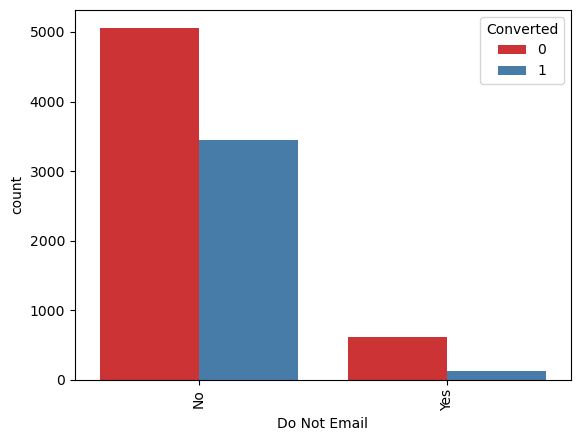

In [66]:
sns.countplot(x = "Do Not Email", hue = "Converted", data = df,palette='Set1')
plt.xticks(rotation = 90)
# people who choose 'no' for do not email has more conversions

([0, 1], [Text(0, 0, 'No'), Text(1, 0, 'Yes')])

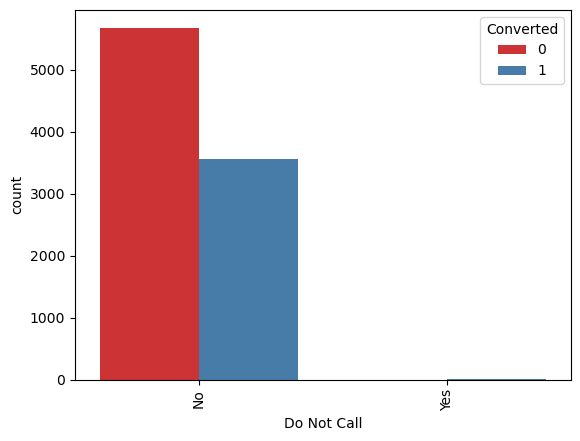

In [67]:
sns.countplot(x = "Do Not Call", hue = "Converted", data = df,palette='Set1')
plt.xticks(rotation = 90)
# who got the calls they converted

<Axes: xlabel='Converted', ylabel='Total Time Spent on Website'>

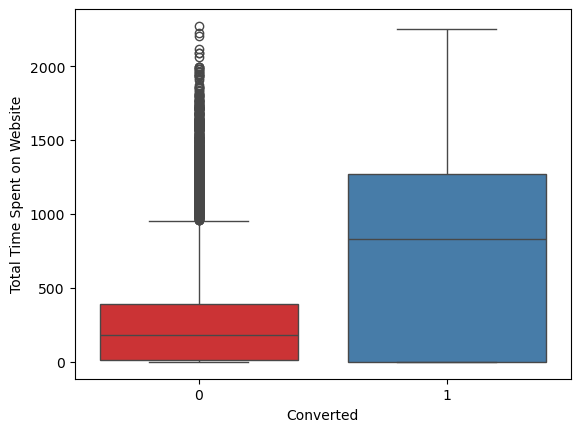

In [68]:
sns.boxplot(y = 'Total Time Spent on Website', x = 'Converted', data = df,palette='Set1')
# people who spect a lot of time on website has higher conversions

([0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16],
 [Text(0, 0, 'Page Visited on Website'),
  Text(1, 0, 'Email Opened'),
  Text(2, 0, 'Unreachable'),
  Text(3, 0, 'Converted to Lead'),
  Text(4, 0, 'Olark Chat Conversation'),
  Text(5, 0, 'Email Bounced'),
  Text(6, 0, 'Email Link Clicked'),
  Text(7, 0, 'Form Submitted on Website'),
  Text(8, 0, 'Unsubscribed'),
  Text(9, 0, 'Had a Phone Conversation'),
  Text(10, 0, 'View in browser link Clicked'),
  Text(11, 0, 'Approached upfront'),
  Text(12, 0, 'SMS Sent'),
  Text(13, 0, 'Visited Booth in Tradeshow'),
  Text(14, 0, 'Resubscribed to emails'),
  Text(15, 0, 'Email Received'),
  Text(16, 0, 'Email Marked Spam')])

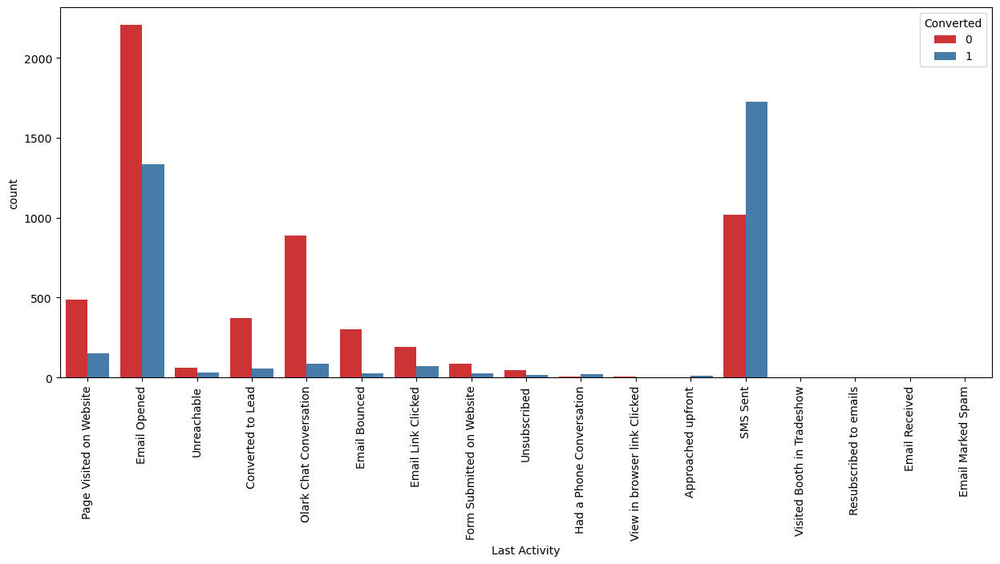

In [69]:
plt.figure(figsize=(15,6))
sns.countplot(x = "Last Activity", hue = "Converted", data = df,palette='Set1')
plt.xticks(rotation = 90)
# last activity 'SMS sent' had converted the most

([0,
  1,
  2,
  3,
  4,
  5,
  6,
  7,
  8,
  9,
  10,
  11,
  12,
  13,
  14,
  15,
  16,
  17,
  18,
  19,
  20,
  21,
  22,
  23,
  24,
  25,
  26,
  27,
  28,
  29,
  30,
  31,
  32,
  33,
  34,
  35,
  36,
  37],
 [Text(0, 0, 'India'),
  Text(1, 0, 'Russia'),
  Text(2, 0, 'Kuwait'),
  Text(3, 0, 'Oman'),
  Text(4, 0, 'United Arab Emirates'),
  Text(5, 0, 'United States'),
  Text(6, 0, 'Australia'),
  Text(7, 0, 'United Kingdom'),
  Text(8, 0, 'Bahrain'),
  Text(9, 0, 'Ghana'),
  Text(10, 0, 'Singapore'),
  Text(11, 0, 'Qatar'),
  Text(12, 0, 'Saudi Arabia'),
  Text(13, 0, 'Belgium'),
  Text(14, 0, 'France'),
  Text(15, 0, 'Sri Lanka'),
  Text(16, 0, 'China'),
  Text(17, 0, 'Canada'),
  Text(18, 0, 'Netherlands'),
  Text(19, 0, 'Sweden'),
  Text(20, 0, 'Nigeria'),
  Text(21, 0, 'Hong Kong'),
  Text(22, 0, 'Germany'),
  Text(23, 0, 'Asia/Pacific Region'),
  Text(24, 0, 'Uganda'),
  Text(25, 0, 'Kenya'),
  Text(26, 0, 'Italy'),
  Text(27, 0, 'South Africa'),
  Text(28, 0, 'Tanzania'

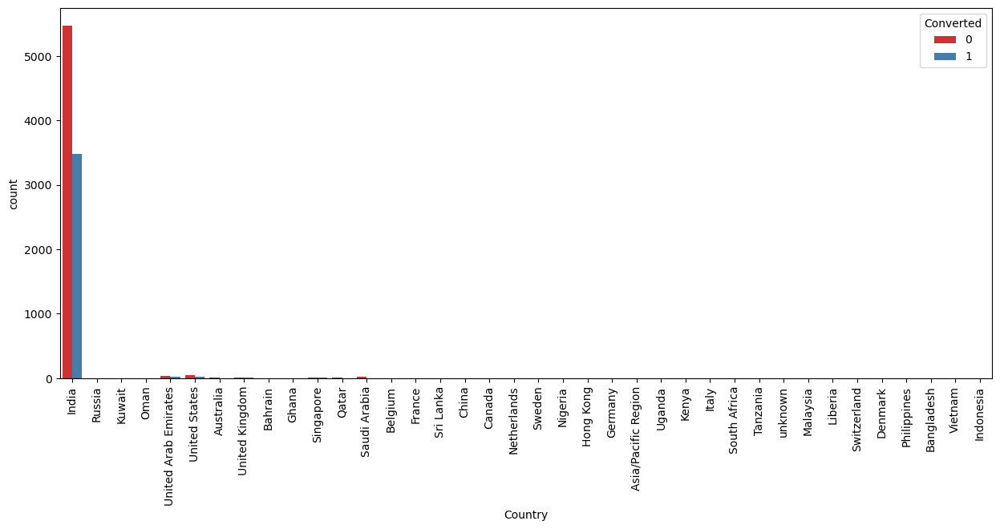

In [70]:
plt.figure(figsize=(15,6))
sns.countplot(x = "Country", hue = "Converted", data = df,palette='Set1')
plt.xticks(rotation = 90)
# indians had converted the most

([0, 1, 2, 3, 4, 5],
 [Text(0, 0, 'Unemployed'),
  Text(1, 0, 'Student'),
  Text(2, 0, 'Other'),
  Text(3, 0, 'Working Professional'),
  Text(4, 0, 'Businessman'),
  Text(5, 0, 'Housewife')])

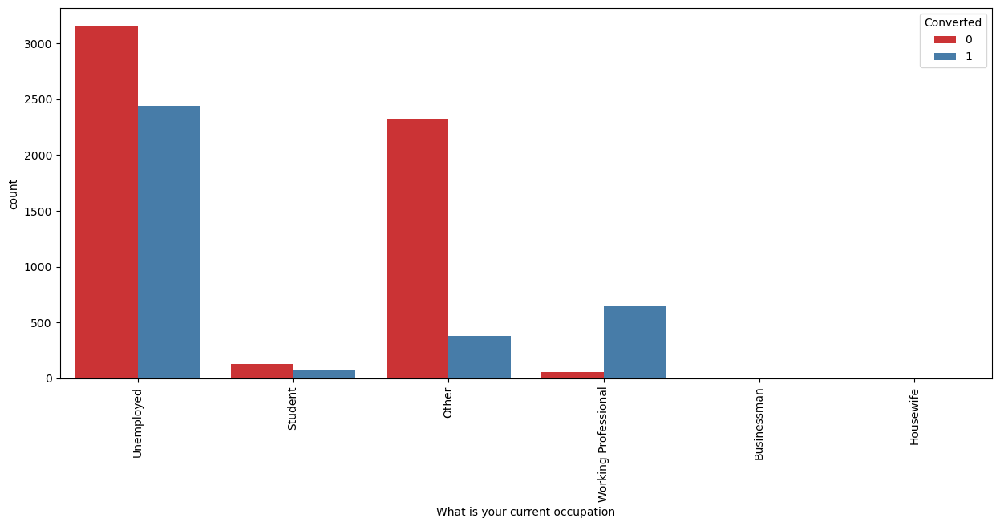

In [71]:
plt.figure(figsize=(15,6))
sns.countplot(x = "What is your current occupation", hue = "Converted", data = df,palette='Set1')
plt.xticks(rotation = 90)
# unemployeed people had converted the most

## Step 5: Data Preprocessing 

### Dummy Variables

In [74]:
cat_cols

['Lead Origin',
 'Lead Source',
 'Do Not Email',
 'Do Not Call',
 'Converted',
 'Last Activity',
 'Specialization',
 'What is your current occupation',
 'What matters most to you in choosing a course',
 'Search',
 'Magazine',
 'Newspaper Article',
 'X Education Forums',
 'Newspaper',
 'Digital Advertisement',
 'Through Recommendations',
 'Receive More Updates About Our Courses',
 'Update me on Supply Chain Content',
 'Get updates on DM Content',
 'City',
 'I agree to pay the amount through cheque',
 'A free copy of Mastering The Interview',
 'Last Notable Activity',
 'Country']

In [75]:
# Firstly we will see which categorical column has yes or no values then change them into binary values (0,1)
for col in cat_cols:
    if df[col].isin(['Yes', 'No']).all():  # Check if the column contains only 'Yes'/'No' values
        df[col] = df[col].map({'Yes': 1, 'No': 0})

In [76]:
df.head()

,Prospect ID,Lead Number,Lead Origin,Lead Source,Do Not Email,Do Not Call,Converted,TotalVisits,Total Time Spent on Website,Page Views Per Visit,Last Activity,Country,Specialization,What is your current occupation,What matters most to you in choosing a course,Search,Magazine,Newspaper Article,X Education Forums,Newspaper,Digital Advertisement,Through Recommendations,Receive More Updates About Our Courses,Update me on Supply Chain Content,Get updates on DM Content,City,I agree to pay the amount through cheque,A free copy of Mastering The Interview,Last Notable Activity
0,7927b2df-8bba-4d29-b9a2-b6e0beafe620,660737,API,Olark Chat,0,0,0,0.0,0.0,0.0,Page Visited on Website,India,Select,Unemployed,Better Career Prospects,0,0,0,0,0,0,0,0,0,0,Select,0,0,Modified
1,2a272436-5132-4136-86fa-dcc88c88f482,660728,API,Organic Search,0,0,0,5.0,674.0,2.5,Email Opened,India,Select,Unemployed,Better Career Prospects,0,0,0,0,0,0,0,0,0,0,Select,0,0,Email Opened
2,8cc8c611-a219-4f35-ad23-fdfd2656bd8a,660727,Landing Page Submission,Direct Traffic,0,0,1,2.0,1532.0,2.0,Email Opened,India,Business Administration,Student,Better Career Prospects,0,0,0,0,0,0,0,0,0,0,Mumbai,0,1,Email Opened
3,0cc2df48-7cf4-4e39-9de9-19797f9b38cc,660719,Landing Page Submission,Direct Traffic,0,0,0,1.0,305.0,1.0,Unreachable,India,Media and Advertising,Unemployed,Better Career Prospects,0,0,0,0,0,0,0,0,0,0,Mumbai,0,0,Modified
4,3256f628-e534-4826-9d63-4a8b88782852,660681,Landing Page Submission,Google,0,0,1,2.0,1428.0,1.0,Converted to Lead,India,Select,Unemployed,Better Career Prospects,0,0,0,0,0,0,0,0,0,0,Mumbai,0,0,Modified


In [77]:
cat_cols

['Lead Origin',
 'Lead Source',
 'Do Not Email',
 'Do Not Call',
 'Converted',
 'Last Activity',
 'Specialization',
 'What is your current occupation',
 'What matters most to you in choosing a course',
 'Search',
 'Magazine',
 'Newspaper Article',
 'X Education Forums',
 'Newspaper',
 'Digital Advertisement',
 'Through Recommendations',
 'Receive More Updates About Our Courses',
 'Update me on Supply Chain Content',
 'Get updates on DM Content',
 'City',
 'I agree to pay the amount through cheque',
 'A free copy of Mastering The Interview',
 'Last Notable Activity',
 'Country']

#### For categorical variables with multiple levels, create dummy features (one-hot encoded)

In [79]:
['Lead Origin',
 'Lead Source',
 'Last Activity',
 'Specialization',
 'What is your current occupation',
 'What matters most to you in choosing a course',
 'City',
 'Last Notable Activity',
 'Country']

['Lead Origin',
 'Lead Source',
 'Last Activity',
 'Specialization',
 'What is your current occupation',
 'What matters most to you in choosing a course',
 'City',
 'Last Notable Activity',
 'Country']

In [80]:
#creating a dataframe for all the dummies
dummy1 = pd.get_dummies(df[['Lead Origin',
 'Lead Source',
 'Last Activity',
 'Specialization',
 'What is your current occupation',
 'What matters most to you in choosing a course',
 'City',
 'Last Notable Activity',
 'Country']], drop_first=True).astype(int)

In [81]:
dummy1.head()

,Lead Origin_Landing Page Submission,Lead Origin_Lead Add Form,Lead Origin_Lead Import,Lead Origin_Quick Add Form,Lead Source_Facebook,Lead Source_Google,Lead Source_Olark Chat,Lead Source_Organic Search,Lead Source_Others,Lead Source_Reference,Lead Source_Referral Sites,Lead Source_Welingak Website,Last Activity_Converted to Lead,Last Activity_Email Bounced,Last Activity_Email Link Clicked,Last Activity_Email Marked Spam,Last Activity_Email Opened,Last Activity_Email Received,Last Activity_Form Submitted on Website,Last Activity_Had a Phone Conversation,Last Activity_Olark Chat Conversation,Last Activity_Page Visited on Website,Last Activity_Resubscribed to emails,Last Activity_SMS Sent,Last Activity_Unreachable,Last Activity_Unsubscribed,Last Activity_View in browser link Clicked,Last Activity_Visited Booth in Tradeshow,Specialization_Business Administration,Specialization_E-Business,Specialization_E-COMMERCE,Specialization_Finance Management,Specialization_Healthcare Management,Specialization_Hospitality Management,Specialization_Human Resource Management,Specialization_IT Projects Management,Specialization_International Business,Specialization_Marketing Management,Specialization_Media and Advertising,Specialization_Operations Management,Specialization_Retail Management,Specialization_Rural and Agribusiness,Specialization_Select,Specialization_Services Excellence,Specialization_Supply Chain Management,Specialization_Travel and Tourism,What is your current occupation_Housewife,What is your current occupation_Other,What is your current occupation_Student,What is your current occupation_Unemployed,What is your current occupation_Working Professional,What matters most to you in choosing a course_Flexibility & Convenience,What matters most to you in choosing a course_Other,City_Other Cities,City_Other Cities of Maharashtra,City_Other Metro Cities,City_Select,City_Thane & Outskirts,City_Tier II Cities,Last Notable Activity_Email Bounced,Last Notable Activity_Email Link Clicked,Last Notable Activity_Email Marked Spam,Last Notable Activity_Email Opened,Last Notable Activity_Email Received,Last Notable Activity_Form Submitted on Website,Last Notable Activity_Had a Phone Conversation,Last Notable Activity_Modified,Last Notable Activity_Olark Chat Conversation,Last Notable Activity_Page Visited on Website,Last Notable Activity_Resubscribed to emails,Last Notable Activity_SMS Sent,Last Notable Activity_Unreachable,Last Notable Activity_Unsubscribed,Last Notable Activity_View in browser link Clicked,Country_Australia,Country_Bahrain,Country_Bangladesh,Country_Belgium,Country_Canada,Country_China,Country_Denmark,Country_France,Country_Germany,Country_Ghana,Country_Hong Kong,Country_India,Country_Indonesia,Country_Italy,Country_Kenya,Country_Kuwait,Country_Liberia,Country_Malaysia,Country_Netherlands,Country_Nigeria,Country_Oman,Country_Philippines,Country_Qatar,Country_Russia,Country_Saudi Arabia,Country_Singapore,Country_South Africa,Country_Sri Lanka,Country_Sweden,Country_Switzerland,Country_Tanzania,Country_Uganda,Country_United Arab Emirates,Country_United Kingdom,Country_United States,Country_Vietnam,Country_unknown
0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0

In [82]:
# Adding the results to the master dataframe
df = pd.concat([df, dummy1], axis=1)

In [83]:
df.head()

,Prospect ID,Lead Number,Lead Origin,Lead Source,Do Not Email,Do Not Call,Converted,TotalVisits,Total Time Spent on Website,Page Views Per Visit,Last Activity,Country,Specialization,What is your current occupation,What matters most to you in choosing a course,Search,Magazine,Newspaper Article,X Education Forums,Newspaper,Digital Advertisement,Through Recommendations,Receive More Updates About Our Courses,Update me on Supply Chain Content,Get updates on DM Content,City,I agree to pay the amount through cheque,A free copy of Mastering The Interview,Last Notable Activity,Lead Origin_Landing Page Submission,Lead Origin_Lead Add Form,Lead Origin_Lead Import,Lead Origin_Quick Add Form,Lead Source_Facebook,Lead Source_Google,Lead Source_Olark Chat,Lead Source_Organic Search,Lead Source_Others,Lead Source_Reference,Lead Source_Referral Sites,Lead Source_Welingak Website,Last Activity_Converted to Lead,Last Activity_Email Bounced,Last Activity_Email Link Clicked,Last Activity_Email Marked Spam,Last Activity_Email Opened,Last Activity_Email Received,Last Activity_Form Submitted on Website,Last Activity_Had a Phone Conversation,Last Activity_Olark Chat Conversation,Last Activity_Page Visited on Website,Last Activity_Resubscribed to emails,Last Activity_SMS Sent,Last Activity_Unreachable,Last Activity_Unsubscribed,Last Activity_View in browser link Clicked,Last Activity_Visited Booth in Tradeshow,Specialization_Business Administration,Specialization_E-Business,Specialization_E-COMMERCE,Specialization_Finance Management,Specialization_Healthcare Management,Specialization_Hospitality Management,Specialization_Human Resource Management,Specialization_IT Projects Management,Specialization_International Business,Specialization_Marketing Management,Specialization_Media and Advertising,Specialization_Operations Management,Specialization_Retail Management,Specialization_Rural and Agribusiness,Specialization_Select,Specialization_Services Excellence,Specialization_Supply Chain Management,Specialization_Travel and Tourism,What is your current occupation_Housewife,What is your current occupation_Other,What is your current occupation_Student,What is your current occupation_Unemployed,What is your current occupation_Working Professional,What matters most to you in choosing a course_Flexibility & Convenience,What matters most to you in choosing a course_Other,City_Other Cities,City_Other Cities of Maharashtra,City_Other Metro Cities,City_Select,City_Thane & Outskirts,City_Tier II Cities,Last Notable Activity_Email Bounced,Last Notable Activity_Email Link Clicked,Last Notable Activity_Email Marked Spam,Last Notable Activity_Email Opened,Last Notable Activity_Email Received,Last Notable Activity_Form Submitted on Website,Last Notable Activity_Had a Phone Conversation,Last Notable Activity_Modified,Last Notable Activity_Olark Chat Conversation,Last Notable Activity_Page Visited on Website,Last Notable Activity_Resubscribed to emails,Last Notable Activity_SMS Sent,Last Notable Activity_Unreachable,Last Notable Activity_Unsubscribed,Last Notable Activity_View in browser link Clicked,Country_Australia,Country_Bahrain,Country_Bangladesh,Country_Belgium,Country_Canada,Country_China,Country_Denmark,Country_France,Country_Germany,Country_Ghana,Country_Hong Kong,Country_India,Country_Indonesia,Country_Italy,Country_Kenya,Country_Kuwait,Country_Liberia,Country_Malaysia,Country_Netherlands,Country_Nigeria,Country_Oman,Country_Philippines,Country_Qatar,Country_Russia,Country_Saudi Arabia,Country_Singapore,Country_South Africa,Country_Sri Lanka,Country_Sweden,Country_Switzerland,Country_Tanzania,Country_Uganda,Country_United Arab Emirates,Country_United Kingdom,Country_United States,Country_Vietnam,Country_unknown
0,7927b2df-8bba-4d29-b9a2-b6e0beafe620,660737,API,Olark Chat,0,0,0,0.0,0.0,0.0,Page Visited on Website,India,Select,Unemployed,Better Career Prospects,0,0,0,0,0,0,0,0,0,0,Select,0,0,Modified,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,

In [84]:
# We have created dummies for the below variables, so we can drop them
df = df.drop(['Lead Origin',
 'Lead Source',
 'Last Activity',
 'Specialization',
 'What is your current occupation',
 'What matters most to you in choosing a course',
 'City',
 'Last Notable Activity',
 'Country'], axis='columns')

In [85]:
df.head()

,Prospect ID,Lead Number,Do Not Email,Do Not Call,Converted,TotalVisits,Total Time Spent on Website,Page Views Per Visit,Search,Magazine,Newspaper Article,X Education Forums,Newspaper,Digital Advertisement,Through Recommendations,Receive More Updates About Our Courses,Update me on Supply Chain Content,Get updates on DM Content,I agree to pay the amount through cheque,A free copy of Mastering The Interview,Lead Origin_Landing Page Submission,Lead Origin_Lead Add Form,Lead Origin_Lead Import,Lead Origin_Quick Add Form,Lead Source_Facebook,Lead Source_Google,Lead Source_Olark Chat,Lead Source_Organic Search,Lead Source_Others,Lead Source_Reference,Lead Source_Referral Sites,Lead Source_Welingak Website,Last Activity_Converted to Lead,Last Activity_Email Bounced,Last Activity_Email Link Clicked,Last Activity_Email Marked Spam,Last Activity_Email Opened,Last Activity_Email Received,Last Activity_Form Submitted on Website,Last Activity_Had a Phone Conversation,Last Activity_Olark Chat Conversation,Last Activity_Page Visited on Website,Last Activity_Resubscribed to emails,Last Activity_SMS Sent,Last Activity_Unreachable,Last Activity_Unsubscribed,Last Activity_View in browser link Clicked,Last Activity_Visited Booth in Tradeshow,Specialization_Business Administration,Specialization_E-Business,Specialization_E-COMMERCE,Specialization_Finance Management,Specialization_Healthcare Management,Specialization_Hospitality Management,Specialization_Human Resource Management,Specialization_IT Projects Management,Specialization_International Business,Specialization_Marketing Management,Specialization_Media and Advertising,Specialization_Operations Management,Specialization_Retail Management,Specialization_Rural and Agribusiness,Specialization_Select,Specialization_Services Excellence,Specialization_Supply Chain Management,Specialization_Travel and Tourism,What is your current occupation_Housewife,What is your current occupation_Other,What is your current occupation_Student,What is your current occupation_Unemployed,What is your current occupation_Working Professional,What matters most to you in choosing a course_Flexibility & Convenience,What matters most to you in choosing a course_Other,City_Other Cities,City_Other Cities of Maharashtra,City_Other Metro Cities,City_Select,City_Thane & Outskirts,City_Tier II Cities,Last Notable Activity_Email Bounced,Last Notable Activity_Email Link Clicked,Last Notable Activity_Email Marked Spam,Last Notable Activity_Email Opened,Last Notable Activity_Email Received,Last Notable Activity_Form Submitted on Website,Last Notable Activity_Had a Phone Conversation,Last Notable Activity_Modified,Last Notable Activity_Olark Chat Conversation,Last Notable Activity_Page Visited on Website,Last Notable Activity_Resubscribed to emails,Last Notable Activity_SMS Sent,Last Notable Activity_Unreachable,Last Notable Activity_Unsubscribed,Last Notable Activity_View in browser link Clicked,Country_Australia,Country_Bahrain,Country_Bangladesh,Country_Belgium,Country_Canada,Country_China,Country_Denmark,Country_France,Country_Germany,Country_Ghana,Country_Hong Kong,Country_India,Country_Indonesia,Country_Italy,Country_Kenya,Country_Kuwait,Country_Liberia,Country_Malaysia,Country_Netherlands,Country_Nigeria,Country_Oman,Country_Philippines,Country_Qatar,Country_Russia,Country_Saudi Arabia,Country_Singapore,Country_South Africa,Country_Sri Lanka,Country_Sweden,Country_Switzerland,Country_Tanzania,Country_Uganda,Country_United Arab Emirates,Country_United Kingdom,Country_United States,Country_Vietnam,Country_unknown
0,7927b2df-8bba-4d29-b9a2-b6e0beafe620,660737,0,0,0,0.0,0.0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,2a272436-5132-4136-86fa-dcc88c88f482,660728,0,0,0,5.0,674.0,2.5,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0

In [86]:
# Now, variables Prospect ID and Lead Number won't be of any use in the analysis, so it's best that we drop these two variables.
df.drop(['Prospect ID', 'Lead Number'], axis='columns', inplace = True)

In [87]:
df.head()

,Do Not Email,Do Not Call,Converted,TotalVisits,Total Time Spent on Website,Page Views Per Visit,Search,Magazine,Newspaper Article,X Education Forums,Newspaper,Digital Advertisement,Through Recommendations,Receive More Updates About Our Courses,Update me on Supply Chain Content,Get updates on DM Content,I agree to pay the amount through cheque,A free copy of Mastering The Interview,Lead Origin_Landing Page Submission,Lead Origin_Lead Add Form,Lead Origin_Lead Import,Lead Origin_Quick Add Form,Lead Source_Facebook,Lead Source_Google,Lead Source_Olark Chat,Lead Source_Organic Search,Lead Source_Others,Lead Source_Reference,Lead Source_Referral Sites,Lead Source_Welingak Website,Last Activity_Converted to Lead,Last Activity_Email Bounced,Last Activity_Email Link Clicked,Last Activity_Email Marked Spam,Last Activity_Email Opened,Last Activity_Email Received,Last Activity_Form Submitted on Website,Last Activity_Had a Phone Conversation,Last Activity_Olark Chat Conversation,Last Activity_Page Visited on Website,Last Activity_Resubscribed to emails,Last Activity_SMS Sent,Last Activity_Unreachable,Last Activity_Unsubscribed,Last Activity_View in browser link Clicked,Last Activity_Visited Booth in Tradeshow,Specialization_Business Administration,Specialization_E-Business,Specialization_E-COMMERCE,Specialization_Finance Management,Specialization_Healthcare Management,Specialization_Hospitality Management,Specialization_Human Resource Management,Specialization_IT Projects Management,Specialization_International Business,Specialization_Marketing Management,Specialization_Media and Advertising,Specialization_Operations Management,Specialization_Retail Management,Specialization_Rural and Agribusiness,Specialization_Select,Specialization_Services Excellence,Specialization_Supply Chain Management,Specialization_Travel and Tourism,What is your current occupation_Housewife,What is your current occupation_Other,What is your current occupation_Student,What is your current occupation_Unemployed,What is your current occupation_Working Professional,What matters most to you in choosing a course_Flexibility & Convenience,What matters most to you in choosing a course_Other,City_Other Cities,City_Other Cities of Maharashtra,City_Other Metro Cities,City_Select,City_Thane & Outskirts,City_Tier II Cities,Last Notable Activity_Email Bounced,Last Notable Activity_Email Link Clicked,Last Notable Activity_Email Marked Spam,Last Notable Activity_Email Opened,Last Notable Activity_Email Received,Last Notable Activity_Form Submitted on Website,Last Notable Activity_Had a Phone Conversation,Last Notable Activity_Modified,Last Notable Activity_Olark Chat Conversation,Last Notable Activity_Page Visited on Website,Last Notable Activity_Resubscribed to emails,Last Notable Activity_SMS Sent,Last Notable Activity_Unreachable,Last Notable Activity_Unsubscribed,Last Notable Activity_View in browser link Clicked,Country_Australia,Country_Bahrain,Country_Bangladesh,Country_Belgium,Country_Canada,Country_China,Country_Denmark,Country_France,Country_Germany,Country_Ghana,Country_Hong Kong,Country_India,Country_Indonesia,Country_Italy,Country_Kenya,Country_Kuwait,Country_Liberia,Country_Malaysia,Country_Netherlands,Country_Nigeria,Country_Oman,Country_Philippines,Country_Qatar,Country_Russia,Country_Saudi Arabia,Country_Singapore,Country_South Africa,Country_Sri Lanka,Country_Sweden,Country_Switzerland,Country_Tanzania,Country_Uganda,Country_United Arab Emirates,Country_United Kingdom,Country_United States,Country_Vietnam,Country_unknown
0,0,0,0,0.0,0.0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,0,0,0,5.0,674.0,2.5,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0

## Step 6: Define X as predictors and y as target column

In [89]:
# Putting feature variable to X
X = df.drop(['Converted'], axis=1)
X.head()

,Do Not Email,Do Not Call,TotalVisits,Total Time Spent on Website,Page Views Per Visit,Search,Magazine,Newspaper Article,X Education Forums,Newspaper,Digital Advertisement,Through Recommendations,Receive More Updates About Our Courses,Update me on Supply Chain Content,Get updates on DM Content,I agree to pay the amount through cheque,A free copy of Mastering The Interview,Lead Origin_Landing Page Submission,Lead Origin_Lead Add Form,Lead Origin_Lead Import,Lead Origin_Quick Add Form,Lead Source_Facebook,Lead Source_Google,Lead Source_Olark Chat,Lead Source_Organic Search,Lead Source_Others,Lead Source_Reference,Lead Source_Referral Sites,Lead Source_Welingak Website,Last Activity_Converted to Lead,Last Activity_Email Bounced,Last Activity_Email Link Clicked,Last Activity_Email Marked Spam,Last Activity_Email Opened,Last Activity_Email Received,Last Activity_Form Submitted on Website,Last Activity_Had a Phone Conversation,Last Activity_Olark Chat Conversation,Last Activity_Page Visited on Website,Last Activity_Resubscribed to emails,Last Activity_SMS Sent,Last Activity_Unreachable,Last Activity_Unsubscribed,Last Activity_View in browser link Clicked,Last Activity_Visited Booth in Tradeshow,Specialization_Business Administration,Specialization_E-Business,Specialization_E-COMMERCE,Specialization_Finance Management,Specialization_Healthcare Management,Specialization_Hospitality Management,Specialization_Human Resource Management,Specialization_IT Projects Management,Specialization_International Business,Specialization_Marketing Management,Specialization_Media and Advertising,Specialization_Operations Management,Specialization_Retail Management,Specialization_Rural and Agribusiness,Specialization_Select,Specialization_Services Excellence,Specialization_Supply Chain Management,Specialization_Travel and Tourism,What is your current occupation_Housewife,What is your current occupation_Other,What is your current occupation_Student,What is your current occupation_Unemployed,What is your current occupation_Working Professional,What matters most to you in choosing a course_Flexibility & Convenience,What matters most to you in choosing a course_Other,City_Other Cities,City_Other Cities of Maharashtra,City_Other Metro Cities,City_Select,City_Thane & Outskirts,City_Tier II Cities,Last Notable Activity_Email Bounced,Last Notable Activity_Email Link Clicked,Last Notable Activity_Email Marked Spam,Last Notable Activity_Email Opened,Last Notable Activity_Email Received,Last Notable Activity_Form Submitted on Website,Last Notable Activity_Had a Phone Conversation,Last Notable Activity_Modified,Last Notable Activity_Olark Chat Conversation,Last Notable Activity_Page Visited on Website,Last Notable Activity_Resubscribed to emails,Last Notable Activity_SMS Sent,Last Notable Activity_Unreachable,Last Notable Activity_Unsubscribed,Last Notable Activity_View in browser link Clicked,Country_Australia,Country_Bahrain,Country_Bangladesh,Country_Belgium,Country_Canada,Country_China,Country_Denmark,Country_France,Country_Germany,Country_Ghana,Country_Hong Kong,Country_India,Country_Indonesia,Country_Italy,Country_Kenya,Country_Kuwait,Country_Liberia,Country_Malaysia,Country_Netherlands,Country_Nigeria,Country_Oman,Country_Philippines,Country_Qatar,Country_Russia,Country_Saudi Arabia,Country_Singapore,Country_South Africa,Country_Sri Lanka,Country_Sweden,Country_Switzerland,Country_Tanzania,Country_Uganda,Country_United Arab Emirates,Country_United Kingdom,Country_United States,Country_Vietnam,Country_unknown
0,0,0,0.0,0.0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,0,0,5.0,674.0,2.5,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0

In [90]:
# Putting response variable to y
y = df['Converted']
y.head()

0    0
1    0
2    1
3    0
4    1
Name: Converted, dtype: int64

## Step 7: Train-Test Split

In [92]:
# importing important library
from sklearn.model_selection import train_test_split


In [93]:
# Splitting the data into train and test
X_train, X_test, y_train, y_test = train_test_split(X, y, train_size=0.7, test_size=0.3, random_state=100)

## Step 8: Feature Scaling

In [95]:
from sklearn.preprocessing import StandardScaler
# will do feature scaling so that it will not affect the model creation with different ranges

In [96]:
num_cols_1

['TotalVisits', 'Total Time Spent on Website', 'Page Views Per Visit']

In [97]:
scaler = StandardScaler()

X_train[['TotalVisits', 'Total Time Spent on Website', 'Page Views Per Visit']] = scaler.fit_transform(X_train[['TotalVisits', 'Total Time Spent on Website', 'Page Views Per Visit']])

X_train.head()

,Do Not Email,Do Not Call,TotalVisits,Total Time Spent on Website,Page Views Per Visit,Search,Magazine,Newspaper Article,X Education Forums,Newspaper,Digital Advertisement,Through Recommendations,Receive More Updates About Our Courses,Update me on Supply Chain Content,Get updates on DM Content,I agree to pay the amount through cheque,A free copy of Mastering The Interview,Lead Origin_Landing Page Submission,Lead Origin_Lead Add Form,Lead Origin_Lead Import,Lead Origin_Quick Add Form,Lead Source_Facebook,Lead Source_Google,Lead Source_Olark Chat,Lead Source_Organic Search,Lead Source_Others,Lead Source_Reference,Lead Source_Referral Sites,Lead Source_Welingak Website,Last Activity_Converted to Lead,Last Activity_Email Bounced,Last Activity_Email Link Clicked,Last Activity_Email Marked Spam,Last Activity_Email Opened,Last Activity_Email Received,Last Activity_Form Submitted on Website,Last Activity_Had a Phone Conversation,Last Activity_Olark Chat Conversation,Last Activity_Page Visited on Website,Last Activity_Resubscribed to emails,Last Activity_SMS Sent,Last Activity_Unreachable,Last Activity_Unsubscribed,Last Activity_View in browser link Clicked,Last Activity_Visited Booth in Tradeshow,Specialization_Business Administration,Specialization_E-Business,Specialization_E-COMMERCE,Specialization_Finance Management,Specialization_Healthcare Management,Specialization_Hospitality Management,Specialization_Human Resource Management,Specialization_IT Projects Management,Specialization_International Business,Specialization_Marketing Management,Specialization_Media and Advertising,Specialization_Operations Management,Specialization_Retail Management,Specialization_Rural and Agribusiness,Specialization_Select,Specialization_Services Excellence,Specialization_Supply Chain Management,Specialization_Travel and Tourism,What is your current occupation_Housewife,What is your current occupation_Other,What is your current occupation_Student,What is your current occupation_Unemployed,What is your current occupation_Working Professional,What matters most to you in choosing a course_Flexibility & Convenience,What matters most to you in choosing a course_Other,City_Other Cities,City_Other Cities of Maharashtra,City_Other Metro Cities,City_Select,City_Thane & Outskirts,City_Tier II Cities,Last Notable Activity_Email Bounced,Last Notable Activity_Email Link Clicked,Last Notable Activity_Email Marked Spam,Last Notable Activity_Email Opened,Last Notable Activity_Email Received,Last Notable Activity_Form Submitted on Website,Last Notable Activity_Had a Phone Conversation,Last Notable Activity_Modified,Last Notable Activity_Olark Chat Conversation,Last Notable Activity_Page Visited on Website,Last Notable Activity_Resubscribed to emails,Last Notable Activity_SMS Sent,Last Notable Activity_Unreachable,Last Notable Activity_Unsubscribed,Last Notable Activity_View in browser link Clicked,Country_Australia,Country_Bahrain,Country_Bangladesh,Country_Belgium,Country_Canada,Country_China,Country_Denmark,Country_France,Country_Germany,Country_Ghana,Country_Hong Kong,Country_India,Country_Indonesia,Country_Italy,Country_Kenya,Country_Kuwait,Country_Liberia,Country_Malaysia,Country_Netherlands,Country_Nigeria,Country_Oman,Country_Philippines,Country_Qatar,Country_Russia,Country_Saudi Arabia,Country_Singapore,Country_South Africa,Country_Sri Lanka,Country_Sweden,Country_Switzerland,Country_Tanzania,Country_Uganda,Country_United Arab Emirates,Country_United Kingdom,Country_United States,Country_Vietnam,Country_unknown
1871,0,0,-1.122305,-0.885371,-1.266675,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
6795,0,0,0.275215,0.005716,-0.516439,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,1,0,0

In [98]:
### Checking the Converted Rate
Converted = (sum(df['Converted'])/len(df['Converted'].index))*100
Converted

38.53896103896104

### Looking at Correlations

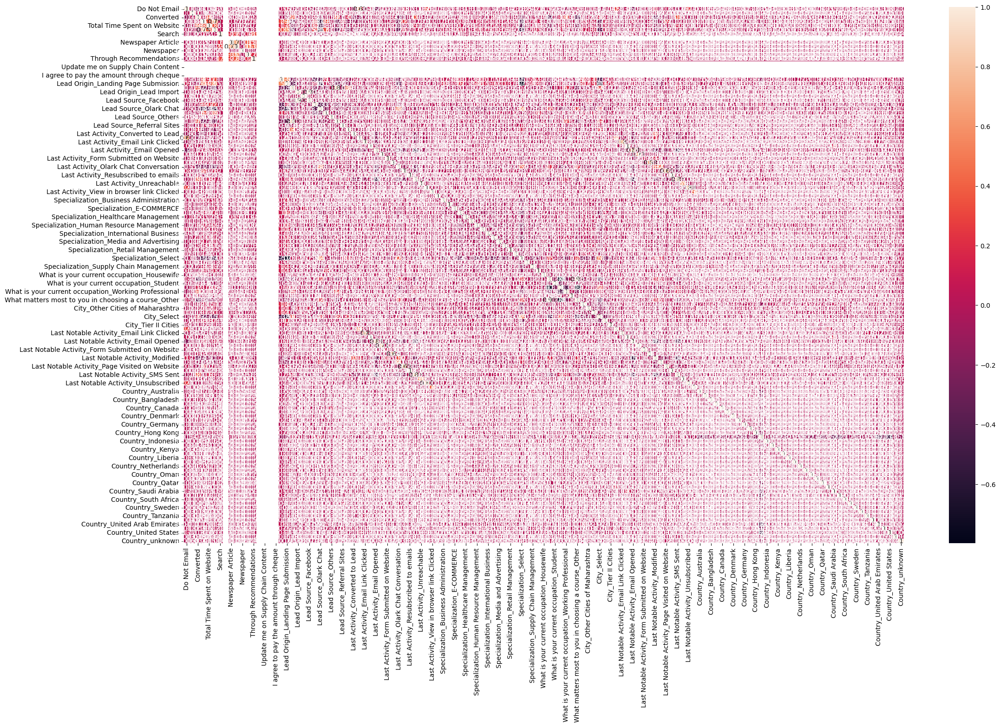

In [100]:
# Let's see the correlation matrix 
plt.figure(figsize = (25,15))        # Size of the figure
sns.heatmap(df.corr(),annot = True)
plt.show()

## Step 9: Model Building

### Running Your First Training Model

In [103]:
import statsmodels.api as sm
# creating the first model without removing any column/ raw model

In [104]:
# Logistic regression model
logm1 = sm.GLM(y_train,(sm.add_constant(X_train)), family = sm.families.Binomial())
logm1.fit().summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:              Converted   No. Observations:                 6468
Model:                            GLM   Df Residuals:                     6353
Model Family:                Binomial   Df Model:                          114
Link Function:                  Logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                    nan
Date:                Tue, 17 Sep 2024   Deviance:                   1.2830e+05
Time:                        20:14:47   Pearson chi2:                 6.27e+18
No. Iterations:                   100   Pseudo R-squ. (CS):                nan
Covariance Type:            nonrobust                                         
===========================================================================================================================================
                                                                              coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------------------------------------------------------------------
const                                                                    3.294e+15   5.73e+07   5.74e+07      0.000    3.29e+15    3.29e+15
Do Not Email                                                            -5.926e+14   4.44e+06  -1.34e+08      0.000   -5.93e+14   -5.93e+14
Do Not Call                                                              6.816e+15   4.77e+07   1.43e+08      0.000    6.82e+15    6.82e+15
TotalVisits                                                              8.922e+13   1.39e+06   6.44e+07      0.000    8.92e+13    8.92e+13
Total Time Spent on Website                                              1.116e+14   9.62e+05   1.16e+08      0.000    1.12e+14    1.12e+14
Page Views Per Visit                                                    -3.929e+13   1.53e+06  -2.56e+07      0.000   -3.93e+13   -3.93e+13
Search                                                                   4.071e+14   2.21e+07   1.84e+07      0.000    4.07e+14    4.07e+14
Magazine                                                                  142.3299    8.5e-07   1.68e+08      0.000     142.330     142.330
Newspaper Article                                                        5.812e+15   6.74e+07   8.63e+07      0.000    5.81e+15    5.81e+15
X Education Forums                                                      -7.695e+15   1.11e+08  -6.91e+07      0.000   -7.69e+15   -7.69e+15
Newspaper                                                               -3.661e+15   6.74e+07  -5.43e+07      0.000   -3.66e+15   -3.66e+15
Digital Advertisement                                                   -4.219e+15   4.77e+07  -8.85e+07      0.000   -4.22e+15   -4.22e+15
Through Recommendations                                                  7.078e+14   2.86e+07   2.47e+07      0.000    7.08e+14    7.08e+14
Receive More Updates About Our Courses                                   -142.8991   2.48e-06  -5.76e+07      0.000    -142.899    -142.899
Update me on Supply Chain Content                                          59.4100   4.36e-07   1.36e+08      0.000      59.410      59.410
Get updates on DM Content                                                  73.2047   9.72e-07   7.53e+07      0.000      73.205      73.205
I agree to pay the amount through cheque                                  -15.6375   4.16e-07  -3.76e+07      0.000     -15.637     -15.637
A free copy of Mastering The Interview                                  -1.029e+13   2.72e+06  -3.79e+06      0.000   -1.03e+13   -1.03e+13
Lead Origin_Landing Page Submission                                      -3.23e+14   3.52e+06  -9.17e+07      0.000   -3.23e+14   -3.23e+14
Lea

## Feature Selection Using RFE

In [106]:
# with RFE columns which are not ranked most affectable will be removed. impactable columns will be there

In [107]:
from sklearn.linear_model import LogisticRegression
from sklearn.feature_selection import RFE

In [108]:
# Define the logistic regression model
logreg = LogisticRegression() 

# Initialize RFE with logistic regression and specify the number of features to select
rfe = RFE(estimator=logreg, n_features_to_select=15)
rfe = rfe.fit(X_train, y_train)

In [109]:
rfe.support_

array([ True, False, False,  True, False, False, False, False, False,
       False, False, False, False, False, False, False, False,  True,
        True, False, False, False, False,  True, False, False, False,
       False,  True, False, False, False, False, False, False, False,
        True, False, False, False,  True, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False,  True, False, False, False,
        True, False, False, False,  True, False,  True, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False,  True, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False,  True, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False]

In [110]:
# to check the column will be there or not in model and whats there rank
list(zip(X_train.columns, rfe.support_, rfe.ranking_))

[('Do Not Email', True, 1),
 ('Do Not Call', False, 42),
 ('TotalVisits', False, 39),
 ('Total Time Spent on Website', True, 1),
 ('Page Views Per Visit', False, 38),
 ('Search', False, 75),
 ('Magazine', False, 107),
 ('Newspaper Article', False, 22),
 ('X Education Forums', False, 70),
 ('Newspaper', False, 11),
 ('Digital Advertisement', False, 26),
 ('Through Recommendations', False, 52),
 ('Receive More Updates About Our Courses', False, 110),
 ('Update me on Supply Chain Content', False, 108),
 ('Get updates on DM Content', False, 112),
 ('I agree to pay the amount through cheque', False, 104),
 ('A free copy of Mastering The Interview', False, 37),
 ('Lead Origin_Landing Page Submission', True, 1),
 ('Lead Origin_Lead Add Form', True, 1),
 ('Lead Origin_Lead Import', False, 57),
 ('Lead Origin_Quick Add Form', False, 72),
 ('Lead Source_Facebook', False, 36),
 ('Lead Source_Google', False, 67),
 ('Lead Source_Olark Chat', True, 1),
 ('Lead Source_Organic Search', False, 85),
 ('

In [111]:
# columns which are selected by RFE
X_train.columns[rfe.support_]

Index(['Do Not Email', 'Total Time Spent on Website',
       'Lead Origin_Landing Page Submission', 'Lead Origin_Lead Add Form',
       'Lead Source_Olark Chat', 'Lead Source_Welingak Website',
       'Last Activity_Had a Phone Conversation', 'Last Activity_SMS Sent',
       'Specialization_Select', 'What is your current occupation_Housewife',
       'What is your current occupation_Working Professional',
       'What matters most to you in choosing a course_Other',
       'Last Notable Activity_Had a Phone Conversation',
       'Last Notable Activity_Unreachable', 'Country_Qatar'],
      dtype='object')

In [112]:
col = ['Do Not Email', 'Total Time Spent on Website',
       'Lead Origin_Landing Page Submission', 'Lead Origin_Lead Add Form',
       'Lead Source_Olark Chat', 'Lead Source_Welingak Website',
       'Last Activity_Had a Phone Conversation', 'Last Activity_SMS Sent',
       'Specialization_Select', 'What is your current occupation_Housewife',
       'What is your current occupation_Working Professional',
       'What matters most to you in choosing a course_Other',
       'Last Notable Activity_Had a Phone Conversation',
       'Last Notable Activity_Unreachable', 'Country_Qatar']

In [113]:
# columns which are not selected by RFE
X_train.columns[~rfe.support_]

Index(['Do Not Call', 'TotalVisits', 'Page Views Per Visit', 'Search',
       'Magazine', 'Newspaper Article', 'X Education Forums', 'Newspaper',
       'Digital Advertisement', 'Through Recommendations',
       ...
       'Country_Sri Lanka', 'Country_Sweden', 'Country_Switzerland',
       'Country_Tanzania', 'Country_Uganda', 'Country_United Arab Emirates',
       'Country_United Kingdom', 'Country_United States', 'Country_Vietnam',
       'Country_unknown'],
      dtype='object', length=113)

In [114]:
# creating a model with RFE selected columns
X_train_sm = sm.add_constant(X_train[col])
logm2 = sm.GLM(y_train,X_train_sm, family = sm.families.Binomial())
res = logm2.fit()
res.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:              Converted   No. Observations:                 6468
Model:                            GLM   Df Residuals:                     6452
Model Family:                Binomial   Df Model:                           15
Link Function:                  Logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -2648.8
Date:                Tue, 17 Sep 2024   Deviance:                       5297.5
Time:                        20:15:12   Pearson chi2:                 7.29e+03
No. Iterations:                    22   Pseudo R-squ. (CS):             0.3997
Covariance Type:            nonrobust                                         
========================================================================================================================
                                                           coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------------------------------------------------
const                                                   -0.3894      0.123     -3.164      0.002      -0.631      -0.148
Do Not Email                                            -1.2936      0.166     -7.780      0.000      -1.619      -0.968
Total Time Spent on Website                              1.0738      0.040     26.999      0.000       0.996       1.152
Lead Origin_Landing Page Submission                     -0.9612      0.127     -7.545      0.000      -1.211      -0.712
Lead Origin_Lead Add Form                                2.9067      0.203     14.348      0.000       2.510       3.304
Lead Source_Olark Chat                                   0.9959      0.120      8.324      0.000       0.761       1.230
Lead Source_Welingak Website                             2.4510      0.746      3.285      0.001       0.989       3.913
Last Activity_Had a Phone Conversation                   0.6633      0.974      0.681      0.496      -1.245       2.572
Last Activity_SMS Sent                                   1.4447      0.074     19.639      0.000       1.301       1.589
Specialization_Select                                   -0.9722      0.122     -7.965      0.000      -1.211      -0.733
What is your current occupation_Housewife               23.8729   2.23e+04      0.001      0.999   -4.37e+04    4.38e+04
What is your current occupation_Working Professional     2.4218      0.191     12.666      0.000       2.047       2.797
What matters most to you in choosing a course_Other     -1.1464      0.087    -13.190      0.000      -1.317      -0.976
Last Notable Activity_Had a Phone Conversation           2.9651      1.488      1.993      0.046       0.049       5.882
Last Notable Activity_Unreachable                        2.0623      0.551      3.746      0.000       0.983       3.141
Country_Qatar                                          -23.2448   2.38e+04     -0.001      0.999   -4.66e+04    4.66e+04
========================================================================================================================
"""

In [115]:
# p value should be less than 0.05 so firstly removing Country_Qatar as it has 0.999 p value

In [116]:
X_train.drop('Country_Qatar', axis = 1, inplace = True)

In [117]:
col

['Do Not Email',
 'Total Time Spent on Website',
 'Lead Origin_Landing Page Submission',
 'Lead Origin_Lead Add Form',
 'Lead Source_Olark Chat',
 'Lead Source_Welingak Website',
 'Last Activity_Had a Phone Conversation',
 'Last Activity_SMS Sent',
 'Specialization_Select',
 'What is your current occupation_Housewife',
 'What is your current occupation_Working Professional',
 'What matters most to you in choosing a course_Other',
 'Last Notable Activity_Had a Phone Conversation',
 'Last Notable Activity_Unreachable',
 'Country_Qatar']

In [118]:
col.remove('Country_Qatar')
col

['Do Not Email',
 'Total Time Spent on Website',
 'Lead Origin_Landing Page Submission',
 'Lead Origin_Lead Add Form',
 'Lead Source_Olark Chat',
 'Lead Source_Welingak Website',
 'Last Activity_Had a Phone Conversation',
 'Last Activity_SMS Sent',
 'Specialization_Select',
 'What is your current occupation_Housewife',
 'What is your current occupation_Working Professional',
 'What matters most to you in choosing a course_Other',
 'Last Notable Activity_Had a Phone Conversation',
 'Last Notable Activity_Unreachable']

In [119]:
X_train_sm = sm.add_constant(X_train[col])
logm2 = sm.GLM(y_train,X_train_sm, family = sm.families.Binomial())
res = logm2.fit()
res.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:              Converted   No. Observations:                 6468
Model:                            GLM   Df Residuals:                     6453
Model Family:                Binomial   Df Model:                           14
Link Function:                  Logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -2652.7
Date:                Tue, 17 Sep 2024   Deviance:                       5305.4
Time:                        20:15:12   Pearson chi2:                 7.29e+03
No. Iterations:                    21   Pseudo R-squ. (CS):             0.3990
Covariance Type:            nonrobust                                         
========================================================================================================================
                                                           coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------------------------------------------------
const                                                   -0.3899      0.123     -3.170      0.002      -0.631      -0.149
Do Not Email                                            -1.2899      0.166     -7.759      0.000      -1.616      -0.964
Total Time Spent on Website                              1.0720      0.040     26.997      0.000       0.994       1.150
Lead Origin_Landing Page Submission                     -0.9657      0.127     -7.582      0.000      -1.215      -0.716
Lead Origin_Lead Add Form                                2.9057      0.203     14.347      0.000       2.509       3.303
Lead Source_Olark Chat                                   0.9941      0.120      8.315      0.000       0.760       1.228
Lead Source_Welingak Website                             2.4510      0.746      3.285      0.001       0.989       3.913
Last Activity_Had a Phone Conversation                   0.6665      0.974      0.685      0.494      -1.242       2.575
Last Activity_SMS Sent                                   1.4443      0.073     19.652      0.000       1.300       1.588
Specialization_Select                                   -0.9725      0.122     -7.969      0.000      -1.212      -0.733
What is your current occupation_Housewife               22.8770   1.35e+04      0.002      0.999   -2.65e+04    2.66e+04
What is your current occupation_Working Professional     2.4261      0.191     12.690      0.000       2.051       2.801
What matters most to you in choosing a course_Other     -1.1430      0.087    -13.157      0.000      -1.313      -0.973
Last Notable Activity_Had a Phone Conversation           2.9646      1.488      1.993      0.046       0.049       5.881
Last Notable Activity_Unreachable                        2.0639      0.550      3.750      0.000       0.985       3.143
========================================================================================================================
"""

In [120]:
# we need to drop column"What is your current occupation_Housewife" as well bcz its p value is also very high
X_train.drop('What is your current occupation_Housewife', axis = 1, inplace = True)
col.remove('What is your current occupation_Housewife')
col

['Do Not Email',
 'Total Time Spent on Website',
 'Lead Origin_Landing Page Submission',
 'Lead Origin_Lead Add Form',
 'Lead Source_Olark Chat',
 'Lead Source_Welingak Website',
 'Last Activity_Had a Phone Conversation',
 'Last Activity_SMS Sent',
 'Specialization_Select',
 'What is your current occupation_Working Professional',
 'What matters most to you in choosing a course_Other',
 'Last Notable Activity_Had a Phone Conversation',
 'Last Notable Activity_Unreachable']

In [121]:
X_train_sm = sm.add_constant(X_train[col])
logm2 = sm.GLM(y_train,X_train_sm, family = sm.families.Binomial())
res = logm2.fit()
res.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:              Converted   No. Observations:                 6468
Model:                            GLM   Df Residuals:                     6454
Model Family:                Binomial   Df Model:                           13
Link Function:                  Logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -2659.5
Date:                Tue, 17 Sep 2024   Deviance:                       5319.0
Time:                        20:15:13   Pearson chi2:                 7.31e+03
No. Iterations:                     7   Pseudo R-squ. (CS):             0.3977
Covariance Type:            nonrobust                                         
========================================================================================================================
                                                           coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------------------------------------------------
const                                                   -0.3830      0.123     -3.116      0.002      -0.624      -0.142
Do Not Email                                            -1.2957      0.166     -7.795      0.000      -1.622      -0.970
Total Time Spent on Website                              1.0710      0.040     27.002      0.000       0.993       1.149
Lead Origin_Landing Page Submission                     -0.9607      0.127     -7.548      0.000      -1.210      -0.711
Lead Origin_Lead Add Form                                2.9210      0.202     14.439      0.000       2.525       3.318
Lead Source_Olark Chat                                   0.9931      0.120      8.310      0.000       0.759       1.227
Lead Source_Welingak Website                             2.4353      0.746      3.264      0.001       0.973       3.897
Last Activity_Had a Phone Conversation                   0.6596      0.974      0.677      0.498      -1.249       2.569
Last Activity_SMS Sent                                   1.4364      0.073     19.564      0.000       1.292       1.580
Specialization_Select                                   -0.9761      0.122     -8.003      0.000      -1.215      -0.737
What is your current occupation_Working Professional     2.4175      0.191     12.650      0.000       2.043       2.792
What matters most to you in choosing a course_Other     -1.1468      0.087    -13.210      0.000      -1.317      -0.977
Last Notable Activity_Had a Phone Conversation           2.9609      1.488      1.990      0.047       0.044       5.877
Last Notable Activity_Unreachable                        2.0561      0.551      3.735      0.000       0.977       3.135
========================================================================================================================
"""

In [122]:
# we need to drop column"Last Activity_Had a Phone Conversation" as well bcz its p value is also vary high
X_train.drop('Last Activity_Had a Phone Conversation', axis = 1, inplace = True)
col.remove('Last Activity_Had a Phone Conversation')
col

['Do Not Email',
 'Total Time Spent on Website',
 'Lead Origin_Landing Page Submission',
 'Lead Origin_Lead Add Form',
 'Lead Source_Olark Chat',
 'Lead Source_Welingak Website',
 'Last Activity_SMS Sent',
 'Specialization_Select',
 'What is your current occupation_Working Professional',
 'What matters most to you in choosing a course_Other',
 'Last Notable Activity_Had a Phone Conversation',
 'Last Notable Activity_Unreachable']

In [123]:
# this is the final model which has p values of less than 0.05 and VID of less than 5
X_train_sm = sm.add_constant(X_train[col])
logm2 = sm.GLM(y_train,X_train_sm, family = sm.families.Binomial())
res = logm2.fit()
res.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:              Converted   No. Observations:                 6468
Model:                            GLM   Df Residuals:                     6455
Model Family:                Binomial   Df Model:                           12
Link Function:                  Logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -2659.7
Date:                Tue, 17 Sep 2024   Deviance:                       5319.4
Time:                        20:15:13   Pearson chi2:                 7.12e+03
No. Iterations:                     7   Pseudo R-squ. (CS):             0.3977
Covariance Type:            nonrobust                                         
========================================================================================================================
                                                           coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------------------------------------------------
const                                                   -0.3818      0.123     -3.106      0.002      -0.623      -0.141
Do Not Email                                            -1.2960      0.166     -7.794      0.000      -1.622      -0.970
Total Time Spent on Website                              1.0715      0.040     27.020      0.000       0.994       1.149
Lead Origin_Landing Page Submission                     -0.9609      0.127     -7.550      0.000      -1.210      -0.711
Lead Origin_Lead Add Form                                2.9232      0.202     14.452      0.000       2.527       3.320
Lead Source_Olark Chat                                   0.9922      0.119      8.303      0.000       0.758       1.226
Lead Source_Welingak Website                             2.4324      0.746      3.261      0.001       0.970       3.895
Last Activity_SMS Sent                                   1.4351      0.073     19.552      0.000       1.291       1.579
Specialization_Select                                   -0.9756      0.122     -7.999      0.000      -1.215      -0.737
What is your current occupation_Working Professional     2.4208      0.191     12.674      0.000       2.046       2.795
What matters most to you in choosing a course_Other     -1.1468      0.087    -13.210      0.000      -1.317      -0.977
Last Notable Activity_Had a Phone Conversation           3.6198      1.126      3.214      0.001       1.412       5.827
Last Notable Activity_Unreachable                        2.0552      0.551      3.733      0.000       0.976       3.134
========================================================================================================================
"""

In [124]:
# Check for the VIF values of the feature variables. 
from statsmodels.stats.outliers_influence import variance_inflation_factor

In [125]:
# Create a dataframe that will contain the names of all the feature variables and their respective VIFs
vif = pd.DataFrame()
vif['Features'] = X_train[col].columns
vif['VIF'] = [variance_inflation_factor(X_train[col].values, i) for i in range(X_train[col].shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
7,Specialization_Select,2.12
4,Lead Source_Olark Chat,1.88
2,Lead Origin_Landing Page Submission,1.62
9,What matters most to you in choosing a course_...,1.61
6,Last Activity_SMS Sent,1.49
3,Lead Origin_Lead Add Form,1.46
5,Lead Source_Welingak Website,1.26
1,Total Time Spent on Website,1.24
8,What is your current occupation_Working Profes...,1.19
0,Do Not Email,1.11


##### All variables have a good value of VIF. So we need not drop any more variables and we can proceed with making predictions using this model only

### Predicting y_train

In [128]:
# Now predicting y (target variable) for train data set
y_train_pred = res.predict(X_train_sm).values.reshape(-1)

In [129]:
# printing 10:
y_train_pred[:10]

array([0.41620571, 0.09011928, 0.24859917, 0.82566977, 0.2118312 ,
       0.98911414, 0.10671032, 0.99082472, 0.13529142, 0.89966312])

In [130]:
# Create a new dataframe containing the actual conversion flag and the probabilities predicted by the model

y_train_pred_final = pd.DataFrame({'Converted':y_train.values, 'Conversion_Prob':y_train_pred})
y_train_pred_final.head()

,Converted,Conversion_Prob
0,0,0.416206
1,0,0.090119
2,0,0.248599
3,0,0.825670
4,0,0.211831


In [131]:
# Creating new column 'predicted' with 1 if conversion_Prob > 0.5 else 0
y_train_pred_final['predicted'] = y_train_pred_final.Conversion_Prob.map(lambda x: 1 if x > 0.5 else 0)
y_train_pred_final.head()

,Converted,Conversion_Prob,predicted
0,0,0.416206,0
1,0,0.090119,0
2,0,0.248599,0
3,0,0.825670,1
4,0,0.211831,0


## Step 10: Evaluation

In [133]:
from sklearn.metrics import accuracy_score
from sklearn import metrics

In [134]:
# Let's check the overall accuracy.
print(metrics.accuracy_score(y_train_pred_final.Converted, y_train_pred_final.predicted))

0.814935064935065


In [135]:
# Let's take a look at the confusion matrix again 
confusion = metrics.confusion_matrix(y_train_pred_final.Converted, y_train_pred_final.predicted )
confusion

array([[3545,  457],
       [ 740, 1726]], dtype=int64)

In [136]:
# Let's check the overall accuracy.
metrics.accuracy_score(y_train_pred_final.Converted, y_train_pred_final.predicted)

0.814935064935065

## Metrics beyond simply accuracy

In [138]:
TP = confusion[1,1] # true positive 
TN = confusion[0,0] # true negatives
FP = confusion[0,1] # false positives
FN = confusion[1,0] # false negatives

In [139]:
# Let's see the sensitivity of our logistic regression model
TP / float(TP+FN)

0.699918896999189

In [140]:
# Let us calculate specificity
TN / float(TN+FP)

0.8858070964517741

In [141]:
# Calculate false postive rate - predicting Converted when peopel does not have converted
print(FP/ float(TN+FP))

0.1141929035482259


In [142]:
# positive predictive value 
print (TP / float(TP+FP))

0.7906550618415025


In [143]:
# Negative predictive value
print (TN / float(TN+ FN))

0.8273045507584598


### Plotting the ROC Curve

In [145]:
def draw_roc( actual, probs ):
    fpr, tpr, thresholds = metrics.roc_curve( actual, probs,
                                              drop_intermediate = False )
    auc_score = metrics.roc_auc_score( actual, probs )
    plt.figure(figsize=(5, 5))
    plt.plot( fpr, tpr, label='ROC curve (area = %0.2f)' % auc_score )
    plt.plot([0, 1], [0, 1], 'k--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate or [1 - True Negative Rate]')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver operating characteristic example')
    plt.legend(loc="lower right")
    plt.show()

    return None

In [146]:
fpr, tpr, thresholds = metrics.roc_curve( y_train_pred_final.Converted, y_train_pred_final.Conversion_Prob, drop_intermediate = False )

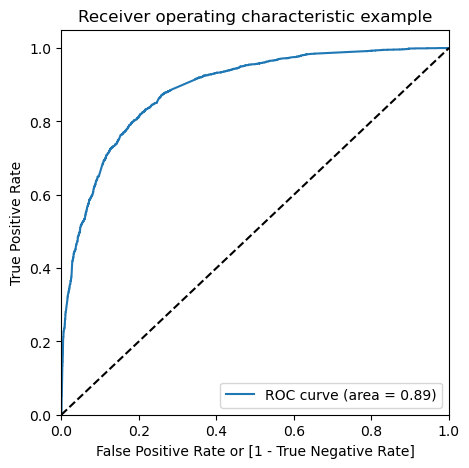

In [147]:
draw_roc(y_train_pred_final.Converted, y_train_pred_final.Conversion_Prob)

### Finding Optimal Cutoff Point

In [149]:
# Optimal cutoff probability is that prob where we get balanced sensitivity and specificity

In [150]:
# Let's create columns with different probability cutoffs 
numbers = [float(x)/10 for x in range(10)]
for i in numbers:
    y_train_pred_final[i]= y_train_pred_final.Conversion_Prob.map(lambda x: 1 if x > i else 0)
y_train_pred_final.head()

,Converted,Conversion_Prob,predicted,0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9
0,0,0.416206,0,1,1,1,1,1,0,0,0,0,0
1,0,0.090119,0,1,0,0,0,0,0,0,0,0,0
2,0,0.248599,0,1,1,1,0,0,0,0,0,0,0
3,0,0.825670,1,1,1,1,1,1,1,1,1,1,0
4,0,0.211831,0,1,1,1,0,0,0,0,0,0,0


In [151]:
# Now let's calculate accuracy sensitivity and specificity for various probability cutoffs.
cutoff_df = pd.DataFrame( columns = ['prob','accuracy','sensi','speci'])
from sklearn.metrics import confusion_matrix

# TP = confusion[1,1] # true positive 
# TN = confusion[0,0] # true negatives
# FP = confusion[0,1] # false positives
# FN = confusion[1,0] # false negatives

num = [0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9]
for i in num:
    cm1 = metrics.confusion_matrix(y_train_pred_final.Converted, y_train_pred_final[i] )
    total1=sum(sum(cm1))
    accuracy = (cm1[0,0]+cm1[1,1])/total1
    
    speci = cm1[0,0]/(cm1[0,0]+cm1[0,1])
    sensi = cm1[1,1]/(cm1[1,0]+cm1[1,1])
    cutoff_df.loc[i] =[ i ,accuracy,sensi,speci]
print(cutoff_df)

     prob  accuracy     sensi     speci
0.0   0.0  0.381262  1.000000  0.000000
0.1   0.1  0.615955  0.976075  0.394053
0.2   0.2  0.749536  0.919708  0.644678
0.3   0.3  0.797928  0.837388  0.773613
0.4   0.4  0.812461  0.771695  0.837581
0.5   0.5  0.814935  0.699919  0.885807
0.6   0.6  0.798083  0.599351  0.920540
0.7   0.7  0.784787  0.523925  0.945527
0.8   0.8  0.765306  0.435118  0.968766
0.9   0.9  0.713203  0.263990  0.990005


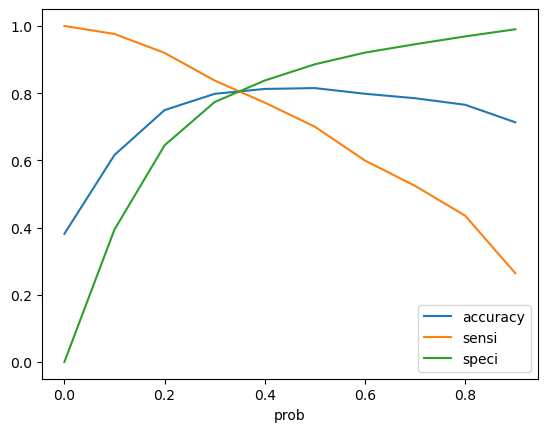

In [152]:
# Let's plot accuracy sensitivity and specificity for various probabilities.
cutoff_df.plot.line(x='prob', y=['accuracy','sensi','speci'])
plt.show()

#### From the curve above, 0.34 is the optimum point to take it as a cutoff probability.

In [154]:
y_train_pred_final['final_predicted'] = y_train_pred_final.Conversion_Prob.map( lambda x: 1 if x > 0.34 else 0)

y_train_pred_final.head()

,Converted,Conversion_Prob,predicted,0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,final_predicted
0,0,0.416206,0,1,1,1,1,1,0,0,0,0,0,1
1,0,0.090119,0,1,0,0,0,0,0,0,0,0,0,0
2,0,0.248599,0,1,1,1,0,0,0,0,0,0,0,0
3,0,0.825670,1,1,1,1,1,1,1,1,1,1,0,1
4,0,0.211831,0,1,1,1,0,0,0,0,0,0,0,0


In [155]:
# Let's check the overall accuracy.
metrics.accuracy_score(y_train_pred_final.Converted, y_train_pred_final.final_predicted)

0.8048855905998763

In [156]:
confusion2 = metrics.confusion_matrix(y_train_pred_final.Converted, y_train_pred_final.final_predicted )
confusion2

array([[3203,  799],
       [ 463, 2003]], dtype=int64)

In [157]:
TP = confusion2[1,1] # true positive 
TN = confusion2[0,0] # true negatives
FP = confusion2[0,1] # false positives
FN = confusion2[1,0] # false negatives

In [158]:
# Let's see the sensitivity of our logistic regression model
TP / float(TP+FN)

0.8122465531224655

In [159]:
# Let us calculate specificity
TN / float(TN+FP)

0.8003498250874562

In [160]:
# Calculate false postive rate - predicting churn when customer does not have churned
print(FP/ float(TN+FP))

0.19965017491254372


In [161]:
# Positive predictive value 
print (TP / float(TP+FP))

0.7148465381870093


In [162]:
# Negative predictive value
print (TN / float(TN+ FN))

0.8737043098745226


### Precision and Recall

In [164]:
#Looking at the confusion matrix again

In [165]:
confusion = metrics.confusion_matrix(y_train_pred_final.Converted, y_train_pred_final.predicted )
confusion

array([[3545,  457],
       [ 740, 1726]], dtype=int64)

##### Precision
TP / TP + FP

In [167]:
confusion[1,1]/(confusion[0,1]+confusion[1,1])

0.7906550618415025

##### Recall
TP / TP + FN

In [169]:
confusion[1,1]/(confusion[1,0]+confusion[1,1])

0.699918896999189

### Precision and recall tradeoff

In [171]:
from sklearn.metrics import precision_recall_curve

In [172]:
y_train_pred_final.Converted, y_train_pred_final.predicted

(0       0
 1       0
 2       0
 3       0
 4       0
 5       1
 6       0
 7       1
 8       0
 9       1
 10      1
 11      0
 12      1
 13      1
 14      0
 15      0
 16      0
 17      0
 18      0
 19      1
 20      1
 21      1
 22      1
 23      1
 24      1
 25      1
 26      0
 27      1
 28      1
 29      0
 30      1
 31      0
 32      1
 33      0
 34      1
 35      0
 36      0
 37      0
 38      0
 39      0
 40      0
 41      0
 42      0
 43      0
 44      0
 45      0
 46      1
 47      0
 48      0
 49      1
 50      0
 51      1
 52      1
 53      1
 54      1
 55      0
 56      1
 57      0
 58      1
 59      0
 60      0
 61      0
 62      1
 63      0
 64      1
 65      0
 66      1
 67      1
 68      0
 69      1
 70      1
 71      0
 72      1
 73      0
 74      0
 75      0
 76      1
 77      0
 78      0
 79      0
 80      0
 81      0
 82      0
 83      0
 84      0
 85      0
 86      0
 87      0
 88      1
 89      1
 90      1

In [173]:
p, r, thresholds = precision_recall_curve(y_train_pred_final.Converted, y_train_pred_final.Conversion_Prob)

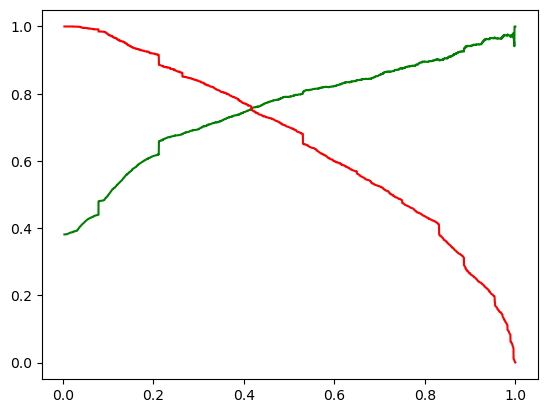

In [174]:
plt.plot(thresholds, p[:-1], "g-")
plt.plot(thresholds, r[:-1], "r-")
plt.show()

## Step 11: Making predictions on the test set

In [176]:
X_test[['TotalVisits', 'Total Time Spent on Website', 'Page Views Per Visit']] = scaler.transform(X_test[['TotalVisits', 'Total Time Spent on Website', 'Page Views Per Visit']])

In [177]:
X_test = X_test[col]
X_test.head()

,Do Not Email,Total Time Spent on Website,Lead Origin_Landing Page Submission,Lead Origin_Lead Add Form,Lead Source_Olark Chat,Lead Source_Welingak Website,Last Activity_SMS Sent,Specialization_Select,What is your current occupation_Working Professional,What matters most to you in choosing a course_Other,Last Notable Activity_Had a Phone Conversation,Last Notable Activity_Unreachable
4269,0,0.964504,0,0,0,0,1,1,0,1,0,0
2376,0,-0.885371,0,1,0,0,1,1,0,0,0,0
7766,0,-0.777416,0,0,0,0,0,0,1,0,0,1
9199,0,-0.885371,0,0,1,0,0,1,0,0,0,0
4359,0,-0.885371,0,1,0,0,0,0,0,0,0,0


In [178]:
X_test_sm = sm.add_constant(X_test)

Making predictions on the test set

In [180]:
y_test_pred = res.predict(X_test_sm)

In [181]:
y_test_pred[:10]

4269    0.491114
2376    0.886172
7766    0.963071
9199    0.211831
4359    0.830987
9186    0.585061
1631    0.424252
8963    0.144224
8007    0.059314
5324    0.367580
dtype: float64

In [182]:
# Converting y_pred to a dataframe which is an array
y_pred_1 = pd.DataFrame(y_test_pred)

In [183]:
# Let's see the head
y_pred_1.head()

,0
4269,0.491114
2376,0.886172
7766,0.963071
9199,0.211831
4359,0.830987


In [184]:
# Converting y_test to dataframe
y_test_df = pd.DataFrame(y_test)

In [185]:
# Putting Prospect ID to index
y_test_df['Prospect ID'] = y_test_df.index

In [186]:
# Removing index for both dataframes to append them side by side 
y_pred_1.reset_index(drop=True, inplace=True)
y_test_df.reset_index(drop=True, inplace=True)

In [187]:
# Appending y_test_df and y_pred_1
y_pred_final = pd.concat([y_test_df, y_pred_1],axis=1)

In [188]:
y_pred_final.head()

,Converted,Prospect ID,0
0,1,4269,0.491114
1,1,2376,0.886172
2,1,7766,0.963071
3,0,9199,0.211831
4,1,4359,0.830987


In [189]:
# Renaming the column 
y_pred_final= y_pred_final.rename(columns={ 0 : 'Conversion_Prob'})

In [190]:
# Rearranging the columns
y_pred_final = y_pred_final.reindex(columns=['Prospect ID', 'Converted', 'Conversion_Prob'])


In [191]:
# Let's see the head of y_pred_final
y_pred_final.head()

,Prospect ID,Converted,Conversion_Prob
0,4269,1,0.491114
1,2376,1,0.886172
2,7766,1,0.963071
3,9199,0,0.211831
4,4359,1,0.830987


In [192]:
y_pred_final['final_predicted'] = y_pred_final.Conversion_Prob.map(lambda x: 1 if x > 0.34 else 0)

In [193]:
y_pred_final.head()

,Prospect ID,Converted,Conversion_Prob,final_predicted
0,4269,1,0.491114,1
1,2376,1,0.886172,1
2,7766,1,0.963071,1
3,9199,0,0.211831,0
4,4359,1,0.830987,1


In [194]:
# Let's check the overall accuracy.
metrics.accuracy_score(y_pred_final.Converted, y_pred_final.final_predicted)

0.8106060606060606

In [195]:
confusion2 = metrics.confusion_matrix(y_pred_final.Converted, y_pred_final.final_predicted )
confusion2

array([[1350,  327],
       [ 198,  897]], dtype=int64)

In [196]:
TP = confusion2[1,1] # true positive 
TN = confusion2[0,0] # true negatives
FP = confusion2[0,1] # false positives
FN = confusion2[1,0] # false negatives

In [197]:
# Let's see the sensitivity of our logistic regression model
TP / float(TP+FN)

0.8191780821917808

In [198]:
# Let us calculate specificity
TN / float(TN+FP)

0.8050089445438283